<a href="https://xeek.ai/challenges/using-ai-to-validate-carbon-containment-in-the-illinois-basin/data"><img src = "https://www.spe.org/binaries/content/gallery/specms/speevents/organization-logos/spe-logo-2020.png" width = 200> 

<h1 align=center><font size = 5>Time Series Prediction for Well Injection Rates Deltas </font></h1>

<h1 align=center><font size = 4> Kannappan Swaminathan</font></h1>
<h1 align=center><font size = 3> April 2023 </font></h1>

Problem Statement

This challenge aims to use time series injection information and monitoring data on a carbon capture well to predict carbon capture well injection rates deltas. Correlating the change in injection rate to the behavior of other parameters in the well can be used to provide a checkpoint against carbon migration from the well or other losses during the process.  The code developed to predict injection rate deltas based on monitoring well data can be used to validate carbon containment throughout the injection of the well. 

#### References

1. https://www.tensorflow.org/tutorials/keras/regression
2. https://xeek.ai/challenges/using-ai-to-validate-carbon-containment-in-the-illinois-basin/data

### Loading Libraries and Data

In [1]:
#!pip install tensorflow --user
#!pip install natsort --user

In [2]:
# General Libraries
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import NullFormatter
import time
import re
import requests
import pickle
import seaborn as sns
import os
import glob
import sys
#from natsort import natsorted
sns.set()

import plotly.graph_objects as go
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

import datetime
from datetime import timedelta, date 
start = time.time()
%matplotlib inline

# Nueral Networks are stocastic; setting random seeds ensures we get the same output each time
SEED = 42
os.environ['PYTHONHASHSEED']=str(SEED)
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'  # TF 2.1
np.random.seed(SEED)
#tf.random.set_seed(SEED)
import random as python_random
python_random.seed(2250)

print('Libraries imported')

Libraries imported


In [3]:
#Receive Data
#dir_name = r'C:\Users\DELL\Documents\GitHub\munishkumar-gh.github.io\Hackathon_2023\1_RAW_Data'
dir_name = r'C:\Users\vasan\OneDrive\03_Github_Projects\CO2MLChallenge_CPEGCS_2023'
#dir_name = r'C:\Users\swaminak\OneDrive - California Resources Corporation\01_Admin\07_MLChallenge'
filename_suffix = 'csv'

In [4]:
# Function to look at first 5 and last 5 elements in a dataframe
def ends(df, x=5):
    return df.head(x).append(df.tail(x))
setattr(pd.DataFrame,'ends',ends)

In [5]:
# Function to read out file
def file_out(df, dir_name, base_filename, filename_suffix):
    try:
        csvs_sht = os.path.join(dir_name, base_filename + "." + filename_suffix)
        df.to_csv(csvs_sht, index = False, header=True)
        print ("Final File Extract Produced")
    except IOError:
        print("I/O error")
    returnb

In [6]:
# Function to search for a text string
def search_words(text):
    result = re.findall(r'\b[^\d\W]+\b', text)
    return " ".join(result)

In [7]:
# Function to create box plot and Histogram
def creating_box_hist(column, df):
    # creating a figure composed of two matplotlib.Axes objects (ax_box and ax_hist)
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, figsize=(20,6),
                                        gridspec_kw={"height_ratios": (.25, .75)})    

    # assigning a graph to each ax
    sns.boxplot(df[column], ax=ax_box)
    sns.histplot(data=df, x=column, ax=ax_hist)

    # Remove x axis name for the boxplot
    ax_box.set(xlabel='')
    plt.show()

In [8]:
# Font, marker size and axis rotation
edgecolors = 'black'
markersize = 16
fontsize = 25
alpha = 0.5
size = 18
rotation = 0

### Loading and Preprocessing Data

Load the dataset and perform some basic preprocessing steps. This includes removing any missing values, converting categorical variables into one-hot encoded format, and scaling the data using StandardScaler.    

##### Read Train Set

In [9]:
base_filename = 'illinois_basing_train_04112023'
csvs_sht = os.path.join(dir_name, base_filename + "." + filename_suffix)
#df.to_csv(csvs_sht, index = True, header = True)
print ("File to be loaded:", csvs_sht)

File to be loaded: C:\Users\vasan\OneDrive\03_Github_Projects\CO2MLChallenge_CPEGCS_2023\illinois_basing_train_04112023.csv


In [10]:
skiprows = 0
#Means read in the ',' as thousand seperator. Also drops all columns which are unnamed.
df = pd.read_csv(csvs_sht, thousands=',', skiprows = skiprows)
df.columns = df.columns.str.replace('\xa0', '')
df.ends()

,SampleTimeUTC,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,...,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
0,10/1/2009 0:00,20.543221,1.880208,59.400879,89.967778,2893.787960,116.539694,2173.710958,104.061007,1599.975952,...,120.209798,3164.194175,121.361094,3184.043494,121.462733,3216.464494,120.278862,2441.864587,111.881138,NaN
1,10/1/2009 1:00,20.543221,1.374349,55.654541,89.825334,2893.793620,116.538811,2173.762679,104.049292,1599.975952,...,120.211298,3164.154578,121.360299,3184.060020,121.461173,3216.520127,120.276792,2442.006201,111.891938,0.000000
2,10/1/2009 2:00,20.543221,1.315104,53.661254,89.806754,2893.791506,116.538623,2173.754085,104.050357,1599.975952,...,120.204548,3164.142426,121.352469,3184.060055,121.468179,3216.510374,120.280932,2442.070968,111.891218,0.000000
3,10/1/2009 3:00,20.543221,1.255859,52.319824,89.806754,2893.786399,116.537392,2173.734355,104.051422,1599.975952,...,120.209048,3164.138940,121.352378,3184.031604,121.476759,3216.479380,120.300598,2442.143066,111.899858,0.000000
4,10/1/2009 4:00,20.543221,1.342448,48.994263,89.610633,2893.774135,116.537714,2173.738489,104.051422,1599.975952,...,120.206798,3164.143589,121.346063,3184.019531,121.474419,3216.436283,120.307843,2442.282528,111.909219,0.000000
27393,11/18/2012 3:00,0.408333,1409.701282,95.934610,530.799145,3385.511261,129.515436,2328.919804,104.920363,NaN,...,123.910423,NaN,NaN,3323.237008,123.410697,3320.264079,122.459648,2641.522160,110.559307,-0.031250
27394,11/18/2012 4:00,0.458333,1409.036129,95.722206,531.937228,3387.451438,129.559802,2328.912415,104.911993,0.100585,...,123.913723,NaN,NaN,3323.269234,123.417552,3320.271702,122.455598,2641.527275,110.556127,-0.091320
27395,11/18/2012 5:00,0.508333,1408.648841,95.857338,526.400194,3387.077108,129.559708,2328.921606,104.916643,0.100585,...,123.916363,NaN,NaN,3323.339665,123.417567,3320.266923,122.465723,2641.525834,110.557732,-0.137501
27396,11/18/2012 6:00,0.504202,1406.788722,95.681030,532.481976,3387.618129,129.578328,2328.940994,104.911782,0.100585,...,123.926406,NaN,NaN,3323.353417,123.409700,3320.181743,122.456771,2641.547556,110.557650,0.037290
27397,11/18/2012 7:00,0.616667,1407.204333,95.600624,517.267830,3386.470343,129.565695,2328.994653,104.907342,0.100585,...,123.945400,NaN,NaN,3323.410433,123.439002,3320.304134,122.450874,2641.584741,110.556937,-0.080345


In [11]:
df.columns

Index(['SampleTimeUTC', 'Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi',
       'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi',
       'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F',
       'Avg_VW1_ANPs_psi', 'Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F',
       'Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F',
       'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F',
       'Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F',
       'Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F',
       'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F',
       'Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F',
       'Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F',
       'Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F',
       'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F',
       'Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F',
       'Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F', 'inj_diff'],
      dtype='object')

In [12]:
df.shape

(27398, 35)

##### Read Test Set

In [13]:
blind_filename = 'illinois_basing_test_04112023'
csvs_sht2 = os.path.join(dir_name, blind_filename + "." + filename_suffix)
#df.to_csv(csvs_sht, index = True, header = True)
print ("File to be loaded:", csvs_sht2)

File to be loaded: C:\Users\vasan\OneDrive\03_Github_Projects\CO2MLChallenge_CPEGCS_2023\illinois_basing_test_04112023.csv


In [14]:
skiprows = 0
#Means read in the ',' as thousand seperator. Also drops all columns which are unnamed.
df_blind = pd.read_csv(csvs_sht2, thousands=',', skiprows = skiprows)
df_blind.columns = df_blind.columns.str.replace('\xa0', '')
df_blind.ends()

,SampleTimeUTC,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,...,Avg_VW1_Z04D6837Ps_psi,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F
0,11/18/2012 8:00,0.825000,1406.469561,95.529213,522.013451,3383.554036,129.535322,2329.030835,104.912923,0.100585,...,3164.411707,123.950680,NaN,NaN,3323.462998,123.443262,3320.276693,122.462348,2641.618345,110.552962
1,11/18/2012 9:00,0.641667,1406.399989,95.191933,510.494516,3385.778632,129.518488,2329.015361,104.909203,0.100585,...,3164.447866,123.953320,NaN,NaN,3323.513243,123.453597,3320.269031,122.457593,2641.630886,110.550592
2,11/18/2012 10:00,0.633333,1406.588710,95.546059,510.899432,3383.531185,129.466555,2329.055794,104.911063,NaN,...,3164.437571,123.950020,NaN,NaN,3323.566427,123.445062,3320.298985,122.453574,2641.633761,110.543437
3,11/18/2012 11:00,0.633333,1407.000806,95.382363,511.896438,3384.563845,129.481727,2329.133431,104.911993,NaN,...,3164.449400,123.955959,NaN,NaN,3323.579193,123.442497,3320.306563,122.458973,2641.664410,110.546602
4,11/18/2012 12:00,0.458333,1406.682945,95.643837,510.982277,3385.062998,129.459261,2329.147909,104.890602,NaN,...,3164.454742,123.952660,NaN,NaN,3323.572024,123.448467,3320.344305,122.463683,2641.688436,110.541832
196,11/26/2012 12:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,104.914033,2.644836,...,3179.919322,124.241981,0.0,0.0,3321.337750,123.516012,3321.700452,122.553698,2640.481917,110.566567
197,11/26/2012 13:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,104.898972,2.620117,...,3179.932792,124.245941,0.0,0.0,3321.381618,123.511662,3321.754409,122.555723,2640.675960,110.560132
198,11/26/2012 14:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,104.900832,2.648498,...,3179.998344,124.251221,0.0,0.0,3321.374638,123.516882,3321.721102,122.550998,2640.760974,110.560132
199,11/26/2012 15:00,1.566667,1419.207662,96.425332,621.174498,3403.130627,129.259234,2327.912443,104.905483,2.674133,...,3180.046558,124.245941,0.0,0.0,3321.392446,123.513387,3321.729205,122.554373,2640.762337,110.563312
200,11/26/2012 16:00,0.025000,1143.615576,89.688881,561.435533,3111.476807,128.116005,2327.892611,104.905483,2.670471,...,3180.016457,124.254520,0.0,0.0,3321.358042,123.512532,3321.724227,122.556398,2640.735295,110.562517


In [15]:
df_blind["inj_diff"] = 0
df_blind.columns

Index(['SampleTimeUTC', 'Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi',
       'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi',
       'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F',
       'Avg_VW1_ANPs_psi', 'Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F',
       'Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F',
       'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F',
       'Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F',
       'Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F',
       'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F',
       'Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F',
       'Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F',
       'Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F',
       'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F',
       'Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F',
       'Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F', 'inj_diff'],
      dtype='object')

In [16]:
df_blind.shape

(201, 35)

##### Combine Both

In [17]:
# concatenate dataframes on datetime index
dfc = pd.concat([df, df_blind], axis=0)

# print merged dataframe
dfc

,SampleTimeUTC,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,...,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
0,10/1/2009 0:00,20.543221,1.880208,59.400879,89.967778,2893.787960,116.539694,2173.710958,104.061007,1599.975952,...,120.209798,3164.194175,121.361094,3184.043494,121.462733,3216.464494,120.278862,2441.864587,111.881138,NaN
1,10/1/2009 1:00,20.543221,1.374349,55.654541,89.825334,2893.793620,116.538811,2173.762679,104.049292,1599.975952,...,120.211298,3164.154578,121.360299,3184.060020,121.461173,3216.520127,120.276792,2442.006201,111.891938,0.0
2,10/1/2009 2:00,20.543221,1.315104,53.661254,89.806754,2893.791506,116.538623,2173.754085,104.050357,1599.975952,...,120.204548,3164.142426,121.352469,3184.060055,121.468179,3216.510374,120.280932,2442.070968,111.891218,0.0
3,10/1/2009 3:00,20.543221,1.255859,52.319824,89.806754,2893.786399,116.537392,2173.734355,104.051422,1599.975952,...,120.209048,3164.138940,121.352378,3184.031604,121.476759,3216.479380,120.300598,2442.143066,111.899858,0.0
4,10/1/2009 4:00,20.543221,1.342448,48.994263,89.610633,2893.774135,116.537714,2173.738489,104.051422,1599.975952,...,120.206798,3164.143589,121.346063,3184.019531,121.474419,3216.436283,120.307843,2442.282528,111.909219,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,11/26/2012 12:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,104.914033,2.644836,...,124.241981,0.000000,0.000000,3321.337750,123.516012,3321.700452,122.553698,2640.481917,110.566567,0.0
197,11/26/2012 13:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,104.898972,2.620117,...,124.245941,0.000000,0.000000,3321.381618,123.511662,3321.754409,122.555723,2640.675960,110.560132,0.0
198,11/26/2012 14:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,104.900832,2.648498,...,124.251221,0.000000,0.000000,3321.374638,123.516882,3321.721102,122.550998,2640.760974,110.560132,0.0
199,11/26/2012 15:00,1.566667,1419.207662,96.425332,621.174498,3403.130627,129.259234,2327.912443,104.905483,2.674133,...,124.245941,0.000000,0.000000,3321.392446,123.513387,3321.729205,122.554373,2640.762337,110.563312,0.0


In [18]:
df1 = dfc.copy()

df1['SampleTimeUTC'] = pd.to_datetime(df1['SampleTimeUTC'])
df1 = df1.set_index("SampleTimeUTC")
idx = pd.date_range(df1.index[0], df1.index[-1])

#df1 = df1.reindex(idx, fill_value=np.nan).dropna()
df1.index.name = "SampleTimeUTC"

df1 = df1.asfreq('H')

#df1.index.freq = "H"
df1

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,Avg_VW1_Z11D4917Ps_psi,...,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
SampleTimeUTC,,,,,,,,,,,,,,,,,,,,,
2009-10-01 00:00:00,20.543221,1.880208,59.400879,89.967778,2893.787960,116.539694,2173.710958,104.061007,1599.975952,2073.104972,...,120.209798,3164.194175,121.361094,3184.043494,121.462733,3216.464494,120.278862,2441.864587,111.881138,NaN
2009-10-01 01:00:00,20.543221,1.374349,55.654541,89.825334,2893.793620,116.538811,2173.762679,104.049292,1599.975952,2073.109141,...,120.211298,3164.154578,121.360299,3184.060020,121.461173,3216.520127,120.276792,2442.006201,111.891938,0.0
2009-10-01 02:00:00,20.543221,1.315104,53.661254,89.806754,2893.791506,116.538623,2173.754085,104.050357,1599.975952,2073.099392,...,120.204548,3164.142426,121.352469,3184.060055,121.468179,3216.510374,120.280932,2442.070968,111.891218,0.0
2009-10-01 03:00:00,20.543221,1.255859,52.319824,89.806754,2893.786399,116.537392,2173.734355,104.051422,1599.975952,2073.094464,...,120.209048,3164.138940,121.352378,3184.031604,121.476759,3216.479380,120.300598,2442.143066,111.899858,0.0
2009-10-01 04:00:00,20.543221,1.342448,48.994263,89.610633,2893.774135,116.537714,2173.738489,104.051422,1599.975952,2073.072345,...,120.206798,3164.143589,121.346063,3184.019531,121.474419,3216.436283,120.307843,2442.282528,111.909219,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-11-26 12:00:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,104.914033,2.644836,2069.778320,...,124.241981,0.000000,0.000000,3321.337750,123.516012,3321.700452,122.553698,2640.481917,110.566567,0.0
2012-11-26 13:00:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,104.898972,2.620117,2069.796224,...,124.245941,0.000000,0.000000,3321.381618,123.511662,3321.754409,122.555723,2640.675960,110.560132,0.0
2012-11-26 14:00:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,104.900832,2.648498,2069.795003,...,124.251221,0.000000,0.000000,3321.374638,123.516882,3321.721102,122.550998,2640.760974,110.560132,0.0


In [19]:
df1.index

DatetimeIndex(['2009-10-01 00:00:00', '2009-10-01 01:00:00',
               '2009-10-01 02:00:00', '2009-10-01 03:00:00',
               '2009-10-01 04:00:00', '2009-10-01 05:00:00',
               '2009-10-01 06:00:00', '2009-10-01 07:00:00',
               '2009-10-01 08:00:00', '2009-10-01 09:00:00',
               ...
               '2012-11-26 07:00:00', '2012-11-26 08:00:00',
               '2012-11-26 09:00:00', '2012-11-26 10:00:00',
               '2012-11-26 11:00:00', '2012-11-26 12:00:00',
               '2012-11-26 13:00:00', '2012-11-26 14:00:00',
               '2012-11-26 15:00:00', '2012-11-26 16:00:00'],
              dtype='datetime64[ns]', name='SampleTimeUTC', length=27665, freq='H')

In [20]:
# in pandas axis=0 represents rows (default) and axis=1 represents columns.
#df1.drop(['Avg_PLT_CO2InjRate_TPH'], axis=1, inplace=True)
df1.ends()

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,Avg_VW1_Z11D4917Ps_psi,...,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
SampleTimeUTC,,,,,,,,,,,,,,,,,,,,,
2009-10-01 00:00:00,20.543221,1.880208,59.400879,89.967778,2893.787960,116.539694,2173.710958,104.061007,1599.975952,2073.104972,...,120.209798,3164.194175,121.361094,3184.043494,121.462733,3216.464494,120.278862,2441.864587,111.881138,NaN
2009-10-01 01:00:00,20.543221,1.374349,55.654541,89.825334,2893.793620,116.538811,2173.762679,104.049292,1599.975952,2073.109141,...,120.211298,3164.154578,121.360299,3184.060020,121.461173,3216.520127,120.276792,2442.006201,111.891938,0.0
2009-10-01 02:00:00,20.543221,1.315104,53.661254,89.806754,2893.791506,116.538623,2173.754085,104.050357,1599.975952,2073.099392,...,120.204548,3164.142426,121.352469,3184.060055,121.468179,3216.510374,120.280932,2442.070968,111.891218,0.0
2009-10-01 03:00:00,20.543221,1.255859,52.319824,89.806754,2893.786399,116.537392,2173.734355,104.051422,1599.975952,2073.094464,...,120.209048,3164.138940,121.352378,3184.031604,121.476759,3216.479380,120.300598,2442.143066,111.899858,0.0
2009-10-01 04:00:00,20.543221,1.342448,48.994263,89.610633,2893.774135,116.537714,2173.738489,104.051422,1599.975952,2073.072345,...,120.206798,3164.143589,121.346063,3184.019531,121.474419,3216.436283,120.307843,2442.282528,111.909219,0.0
2012-11-26 12:00:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,104.914033,2.644836,2069.778320,...,124.241981,0.000000,0.000000,3321.337750,123.516012,3321.700452,122.553698,2640.481917,110.566567,0.0
2012-11-26 13:00:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,104.898972,2.620117,2069.796224,...,124.245941,0.000000,0.000000,3321.381618,123.511662,3321.754409,122.555723,2640.675960,110.560132,0.0
2012-11-26 14:00:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,104.900832,2.648498,2069.795003,...,124.251221,0.000000,0.000000,3321.374638,123.516882,3321.721102,122.550998,2640.760974,110.560132,0.0
2012-11-26 15:00:00,1.566667,1419.207662,96.425332,621.174498,3403.130627,129.259234,2327.912443,104.905483,2.674133,2069.821212,...,124.245941,0.000000,0.000000,3321.392446,123.513387,3321.729205,122.554373,2640.762337,110.563312,0.0


In [21]:
# Check for Missing Values

print("Column Names: ", df1.columns.values)
print("\n")
print("Information:", df1.info())
print("\n")
print("Descriptive Statistics: ")
df1.describe()

Column Names:  ['Avg_PLT_CO2VentRate_TPH' 'Avg_CCS1_WHCO2InjPs_psi'
 'Avg_CCS1_WHCO2InjTp_F' 'Avg_CCS1_ANPs_psi' 'Avg_CCS1_DH6325Ps_psi'
 'Avg_CCS1_DH6325Tp_F' 'Avg_VW1_WBTbgPs_psi' 'Avg_VW1_WBTbgTp_F'
 'Avg_VW1_ANPs_psi' 'Avg_VW1_Z11D4917Ps_psi' 'Avg_VW1_Z11D4917Tp_F'
 'Avg_VW1_Z10D5001Ps_psi' 'Avg_VW1_Z10D5001Tp_F' 'Avg_VW1_Z09D5653Ps_psi'
 'Avg_VW1_Z09D5653Tp_F' 'Avg_VW1_Z08D5840Ps_psi' 'Avg_VW1_Z08D5840Tp_F'
 'Avg_VW1_Z07D6416Ps_psi' 'Avg_VW1_Z07D6416Tp_F' 'Avg_VW1_Z06D6632Ps_psi'
 'Avg_VW1_Z06D6632Tp_F' 'Avg_VW1_Z05D6720Ps_psi' 'Avg_VW1_Z05D6720Tp_F'
 'Avg_VW1_Z04D6837Ps_psi' 'Avg_VW1_Z04D6837Tp_F' 'Avg_VW1_Z03D6945Ps_psi'
 'Avg_VW1_Z03D6945Tp_F' 'Avg_VW1_Z02D6982Ps_psi' 'Avg_VW1_Z02D6982Tp_F'
 'Avg_VW1_Z01D7061Ps_psi' 'Avg_VW1_Z01D7061Tp_F'
 'Avg_VW1_Z0910D5482Ps_psi' 'Avg_VW1_Z0910D5482Tp_F' 'inj_diff']


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 27665 entries, 2009-10-01 00:00:00 to 2012-11-26 16:00:00
Freq: H
Data columns (total 34 columns):
 #   Column             

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,Avg_VW1_Z11D4917Ps_psi,...,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
count,27599.000000,27471.000000,27599.000000,27505.000000,27599.000000,27599.000000,26328.000000,26262.000000,23684.000000,26889.000000,...,26801.000000,24429.000000,26000.000000,26624.000000,26624.000000,25508.000000,25309.000000,26910.000000,26910.000000,27598.000000
mean,2.113281,1240.632225,89.793343,560.439814,3244.935867,127.747717,1805.830064,80.979157,520.651267,1601.007991,...,91.216127,2344.397754,181.804967,2463.146027,91.515917,2308.234983,86.150396,1861.436273,86.495113,0.001639
std,132.676465,814.996296,48.119061,444.335806,173.214886,7.142840,996.588122,44.167237,3972.367318,870.935528,...,51.475579,1498.745854,368.142004,1455.555985,52.574706,1518.093354,55.242487,1016.008649,46.592920,82.388562
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-11021.132640
25%,0.000000,1236.485623,93.058571,522.789568,3233.664986,127.205312,2205.032657,103.427726,0.459472,2070.197540,...,118.826803,0.000000,0.000000,0.000000,85.902878,0.000000,0.000000,2353.682372,110.493778,-0.072222
50%,0.058333,1339.164863,96.268227,564.508964,3286.447463,130.089414,2322.399902,104.202276,4.438812,2073.357747,...,119.549050,3299.633779,121.288188,3316.618997,121.277948,3318.393405,121.426734,2375.090312,111.443982,0.000000
75%,0.150000,1361.310195,96.847573,604.531733,3325.815938,131.076901,2379.376253,105.037130,16.855193,2074.032729,...,119.873154,3320.594834,122.825662,3331.923096,122.050829,3327.218847,122.541638,2416.335597,111.973354,0.073264
max,18333.150000,39032.410160,2879.416016,24105.630860,3515.880615,135.670399,4954.731745,120.056561,31993.509770,2377.999424,...,125.766369,3457.878882,1602.857486,3499.615312,124.310501,3445.065566,133.912303,2758.334188,113.687965,7033.459028


In [22]:
print("Name of Columns that have Missing Values:\n", df1.columns[df1.isnull().any()])

Name of Columns that have Missing Values:
 Index(['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi',
       'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi',
       'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F',
       'Avg_VW1_ANPs_psi', 'Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F',
       'Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F',
       'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F',
       'Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F',
       'Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F',
       'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F',
       'Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F',
       'Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F',
       'Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F',
       'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F',
       'Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F',
       'Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F', 'inj_diff'],
      dtype='object')


In [23]:
df2 = df1.ffill(axis = 0) #Forward fill null or blank values
df3 = df2.backfill(axis = 0) #Back fill null or blank values

In [24]:
df3.isnull().sum()

Avg_PLT_CO2VentRate_TPH     0
Avg_CCS1_WHCO2InjPs_psi     0
Avg_CCS1_WHCO2InjTp_F       0
Avg_CCS1_ANPs_psi           0
Avg_CCS1_DH6325Ps_psi       0
Avg_CCS1_DH6325Tp_F         0
Avg_VW1_WBTbgPs_psi         0
Avg_VW1_WBTbgTp_F           0
Avg_VW1_ANPs_psi            0
Avg_VW1_Z11D4917Ps_psi      0
Avg_VW1_Z11D4917Tp_F        0
Avg_VW1_Z10D5001Ps_psi      0
Avg_VW1_Z10D5001Tp_F        0
Avg_VW1_Z09D5653Ps_psi      0
Avg_VW1_Z09D5653Tp_F        0
Avg_VW1_Z08D5840Ps_psi      0
Avg_VW1_Z08D5840Tp_F        0
Avg_VW1_Z07D6416Ps_psi      0
Avg_VW1_Z07D6416Tp_F        0
Avg_VW1_Z06D6632Ps_psi      0
Avg_VW1_Z06D6632Tp_F        0
Avg_VW1_Z05D6720Ps_psi      0
Avg_VW1_Z05D6720Tp_F        0
Avg_VW1_Z04D6837Ps_psi      0
Avg_VW1_Z04D6837Tp_F        0
Avg_VW1_Z03D6945Ps_psi      0
Avg_VW1_Z03D6945Tp_F        0
Avg_VW1_Z02D6982Ps_psi      0
Avg_VW1_Z02D6982Tp_F        0
Avg_VW1_Z01D7061Ps_psi      0
Avg_VW1_Z01D7061Tp_F        0
Avg_VW1_Z0910D5482Ps_psi    0
Avg_VW1_Z0910D5482Tp_F      0
inj_diff  

### Exploratory Data Analysis

Viewing the data to make sense of trends

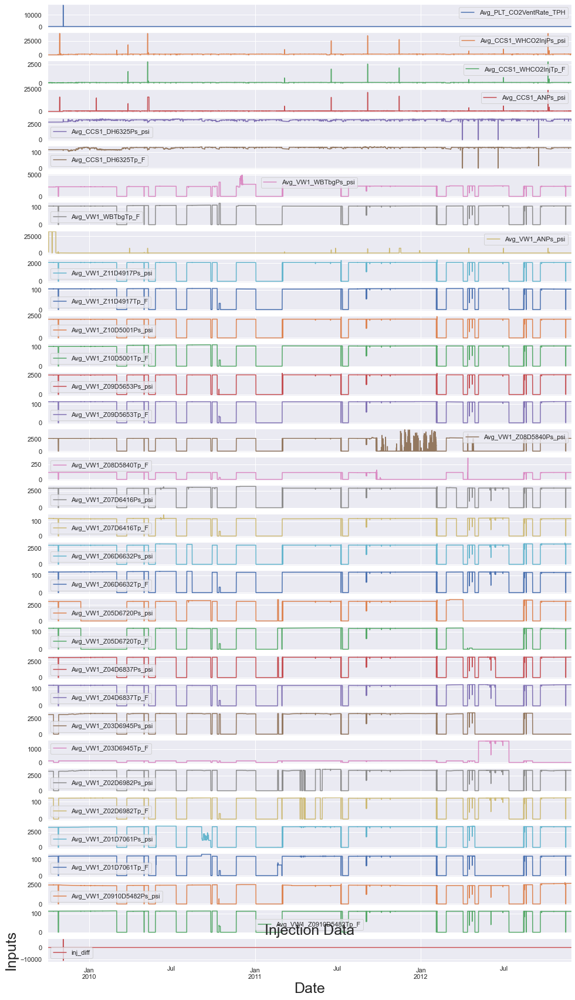

In [25]:
# sort by date
df3 = df3.sort_index()

# plot
df3.plot(figsize=(16, 30), subplots=True, sharex=True)
plt.title("Injection Data", size=fontsize)
plt.xlabel("Date", size=fontsize)
plt.ylabel("Inputs", size=fontsize)
plt.show()

In [26]:
df3.corr().style.background_gradient(cmap = "YlGnBu")

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_WBTbgTp_F,Avg_VW1_ANPs_psi,Avg_VW1_Z11D4917Ps_psi,Avg_VW1_Z11D4917Tp_F,Avg_VW1_Z10D5001Ps_psi,Avg_VW1_Z10D5001Tp_F,Avg_VW1_Z09D5653Ps_psi,Avg_VW1_Z09D5653Tp_F,Avg_VW1_Z08D5840Ps_psi,Avg_VW1_Z08D5840Tp_F,Avg_VW1_Z07D6416Ps_psi,Avg_VW1_Z07D6416Tp_F,Avg_VW1_Z06D6632Ps_psi,Avg_VW1_Z06D6632Tp_F,Avg_VW1_Z05D6720Ps_psi,Avg_VW1_Z05D6720Tp_F,Avg_VW1_Z04D6837Ps_psi,Avg_VW1_Z04D6837Tp_F,Avg_VW1_Z03D6945Ps_psi,Avg_VW1_Z03D6945Tp_F,Avg_VW1_Z02D6982Ps_psi,Avg_VW1_Z02D6982Tp_F,Avg_VW1_Z01D7061Ps_psi,Avg_VW1_Z01D7061Tp_F,Avg_VW1_Z0910D5482Ps_psi,Avg_VW1_Z0910D5482Tp_F,inj_diff
Avg_PLT_CO2VentRate_TPH,1.000000,-0.001369,-0.004962,-0.001374,-0.005543,-0.022174,0.005654,0.007092,0.016195,0.007049,0.006951,0.006978,0.006238,0.006927,0.007146,0.010043,0.010741,0.007021,0.007300,0.007572,0.008061,0.010240,0.010558,0.007361,0.007408,0.005911,-0.002935,0.003879,0.004572,0.008093,0.008457,0.007278,0.007213,0.528036
Avg_CCS1_WHCO2InjPs_psi,-0.001369,1.000000,0.527535,0.531050,0.064181,0.068909,-0.000622,-0.004482,-0.100484,-0.003389,-0.004286,-0.003235,-0.003462,-0.003194,-0.004825,-0.024753,-0.029041,-0.004940,-0.006083,-0.003630,-0.006698,-0.003975,-0.005071,-0.007897,-0.008465,-0.005550,0.019499,0.013443,0.012957,-0.011433,-0.013844,-0.002478,-0.005174,0.000667
Avg_CCS1_WHCO2InjTp_F,-0.004962,0.527535,1.000000,0.339381,0.141166,0.140557,-0.024654,-0.029933,-0.029654,-0.030221,-0.030552,-0.029926,-0.028073,-0.029833,-0.031335,-0.054612,-0.059884,-0.031370,-0.031254,-0.033349,-0.037117,-0.033497,-0.033471,-0.037149,-0.037365,-0.040312,0.027513,-0.017967,-0.020739,-0.042940,-0.045318,-0.029643,-0.032107,0.000158
Avg_CCS1_ANPs_psi,-0.001374,0.531050,0.339381,1.000000,-0.066565,-0.038733,-0.008174,-0.004912,-0.048707,-0.005352,-0.005495,-0.005286,-0.003637,-0.005362,-0.005338,0.010939,0.013229,-0.003389,-0.003192,-0.004858,-0.003428,0.002310,0.001392,-0.003798,-0.006295,0.010737,-0.011473,0.008527,0.007330,0.002335,0.000898,-0.005481,-0.005710,-0.000036
Avg_CCS1_DH6325Ps_psi,-0.005543,0.064181,0.141166,-0.066565,1.000000,0.819741,-0.047751,-0.056710,-0.243142,-0.053045,-0.053050,-0.052383,-0.048886,-0.052155,-0.054607,-0.156548,-0.173412,-0.030467,-0.029860,-0.051800,-0.060759,-0.112577,-0.113113,-0.069657,-0.069019,-0.089261,0.099260,-0.013387,-0.018240,-0.094349,-0.105954,-0.053506,-0.056467,0.005199
Avg_CCS1_DH6325Tp_F,-0.022174,0.068909,0.140557,-0.038733,0.819741,1.000000,-0.034256,-0.059824,-0.185225,-0.063927,-0.062224,-0.062709,-0.050813,-0.062465,-0.064525,-0.173706,-0.193842,-0.035265,-0.036372,-0.089525,-0.096185,0.034266,0.040050,-0.070480,-0.067528,-0.052742,0.059815,-0.050117,-0.051082,-0.091943,-0.090365,-0.062251,-0.066852,-0.000507
Avg_VW1_WBTbgPs_psi,0.005654,-0.000622,-0.024654,-0.008174,-0.047751,-0.034256,1.000000,0.980800,0.044941,0.975325,0.972044,0.975391,0.972091,0.975552,0.971703,0.651236,0.618521,0.942870,0.937104,0.891872,0.887462,0.701072,0.675483,0.902024,0.879168,0.723896,0.266809,0.879059,0.854969,0.821347,0.814174,0.974541,0.972056,0.000071
Avg_VW1_WBTbgTp_F,0.007092,-0.004482,-0.029933,-0.004912,-0.056710,-0.059824,0.980800,1.000000,0.065008,0.983132,0.994697,0.983173,0.994702,0.983152,0.994329,0.663331,0.643756,0.949479,0.959973,0.887002,0.896599,0.696056,0.682146,0.911261,0.901931,0.723916,0.260258,0.888983,0.879486,0.828630,0.839998,0.981823,0.994460,-0.000024
Avg_VW1_ANPs_psi,0.016195,-0.100484,-0.029654,-0.048707,-0.243142,-0.185225,0.044941,0.065008,1.000000,0.068819,0.066751,0.068152,0.059504,0.067585,0.068333,0.090954,0.092250,0.068412,0.072067,0.071701,0.075077,0.092116,0.093806,0.069779,0.070988,0.003978,-0.030349,-0.019008,-0.014945,0.074782,0.076867,0.072604,0.069071,-0.000036
Avg_VW1_Z11D4917Ps_psi,0.007049,-0.003389,-0.030221,-0.005352,-0.053045,-0.063927,0.975325,0.983132,0.068819,1.000000,0.991640,0.999996,0.990665,0.999966,0.991705,0.671868,0.63484

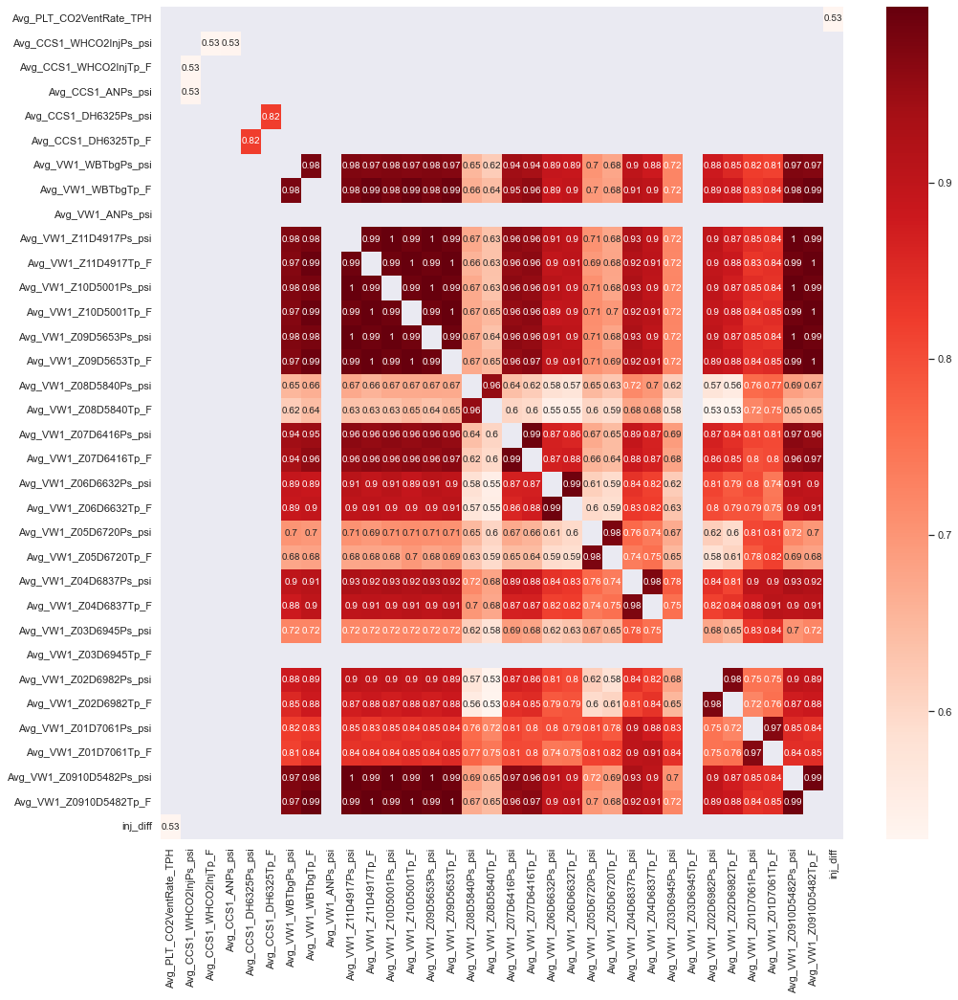

In [27]:
cor_matrix = df3.corr()

filteredDf = cor_matrix[((cor_matrix >= .5) | (cor_matrix <= -.5)) & (cor_matrix !=1.000)]
plt.figure(figsize=(16,16))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
plt.savefig('matrix.jpeg')
plt.show()

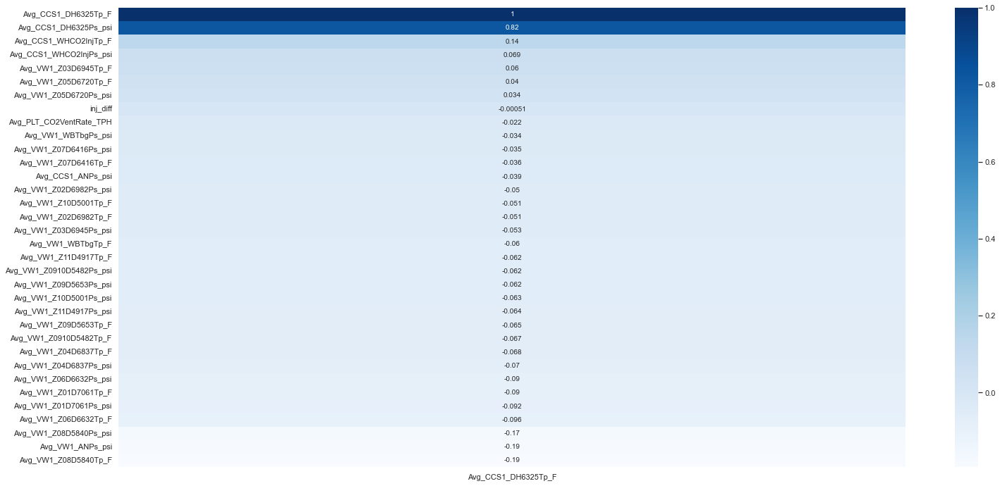

In [28]:
#Ranking the correlatable variables
cor_matrix = df3.corr()
cor_matrix[['Avg_CCS1_DH6325Tp_F']]

f, ax = plt.subplots(figsize=(25, 12))
sns.heatmap(cor_matrix[['Avg_CCS1_DH6325Tp_F']].sort_values(by=['Avg_CCS1_DH6325Tp_F'], 
                                                 ascending =False), annot=True, cmap="Blues")

plt.show()

In [29]:
# Count the number of zero values per column
zero_counts = (df == 0).sum(axis=0)
zero_counts = zero_counts.sort_values(ascending=False)

# Print the zero counts
print(zero_counts)

Avg_VW1_Z08D5840Tp_F        10310
Avg_VW1_Z08D5840Ps_psi      10012
Avg_PLT_CO2VentRate_TPH      8818
Avg_VW1_Z05D6720Ps_psi       7665
Avg_VW1_Z01D7061Ps_psi       7599
Avg_VW1_Z05D6720Tp_F         7347
Avg_VW1_Z01D7061Tp_F         7283
Avg_VW1_Z03D6945Ps_psi       7003
Avg_VW1_Z02D6982Ps_psi       6866
Avg_VW1_Z04D6837Ps_psi       6736
Avg_VW1_Z03D6945Tp_F         6718
Avg_VW1_Z02D6982Tp_F         6550
Avg_VW1_Z07D6416Ps_psi       6499
Avg_VW1_Z04D6837Tp_F         6420
Avg_VW1_Z07D6416Tp_F         6355
Avg_VW1_Z06D6632Ps_psi       6150
Avg_VW1_Z0910D5482Ps_psi     6147
Avg_VW1_Z11D4917Ps_psi       6127
Avg_VW1_Z10D5001Ps_psi       6127
Avg_VW1_Z09D5653Ps_psi       6126
Avg_VW1_WBTbgPs_psi          6078
Avg_VW1_Z06D6632Tp_F         6006
Avg_VW1_Z0910D5482Tp_F       6004
Avg_VW1_WBTbgTp_F            6004
Avg_VW1_Z09D5653Tp_F         6004
Avg_VW1_Z11D4917Tp_F         6004
Avg_VW1_Z10D5001Tp_F         6004
inj_diff                     3832
Avg_VW1_ANPs_psi              249
Avg_CCS1_ANPs_

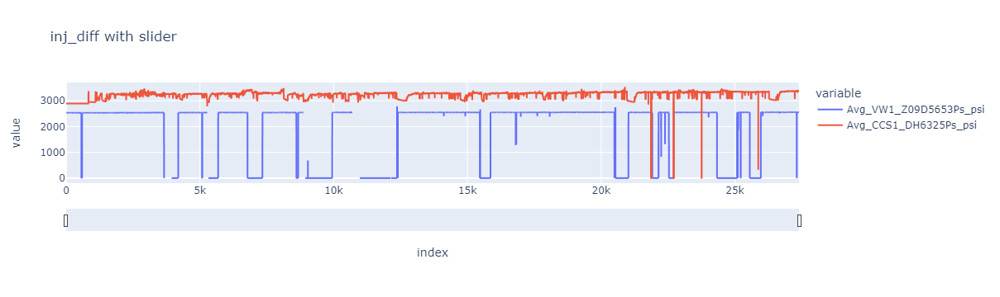

<Figure size 1152x648 with 0 Axes>

In [30]:
plt.figure(figsize=(16,9))
fig = px.line(df, x=df.index, y=['Avg_VW1_Z09D5653Ps_psi', 'Avg_CCS1_DH6325Ps_psi'], title='inj_diff with slider')
fig.update_xaxes(rangeslider_visible=True)
#fig.update_yaxes(range=[-0.5, 0.5])  # set y-axis limit here
#fig.show() 

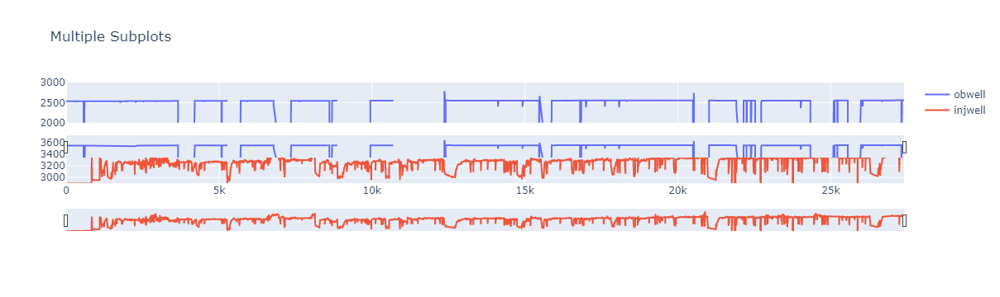

In [31]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# create subplots
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.2)

# add traces to subplots
fig.add_trace(go.Scatter(x=df.index, y=df['Avg_VW1_Z09D5653Ps_psi'], name='obwell'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=df['Avg_CCS1_DH6325Ps_psi'], name='injwell'), row=2, col=1)

# add range slider
fig.update_xaxes(rangeslider_visible=True)

# set y-axis limits
fig.update_yaxes(range=[2000, 3000], row=1, col=1)
fig.update_yaxes(range=[2900, 3600], row=2, col=1)

# update subplot titles
#fig.update_yaxes(title_text='y1', row=1, col=1)
#fig.update_yaxes(title_text='y2', row=2, col=1)

# update figure title
fig.update_layout(title='Multiple Subplots')

# show figure
fig.show()

In [32]:
#drop_cols = [col for col in df3.columns if 'Tp_F' in col]

#df4 = df3[df3.columns.drop(drop_cols)]

#df5 = df4[['Avg_PLT_CO2VentRate_TPH', 
#           'Avg_CCS1_WHCO2InjPs_psi', 
#           'Avg_CCS1_ANPs_psi',
#           'Avg_CCS1_DH6325Ps_psi', 
#           'Avg_VW1_WBTbgPs_psi', 
#           #'Avg_VW1_ANPs_psi', 
#           #'Avg_VW1_Z09D5653Ps_psi',
#           'Avg_VW1_Z01D7061Ps_psi',
#           'inj_diff',
#          ]]

df5 = df3[['Avg_PLT_CO2VentRate_TPH',
           'Avg_CCS1_WHCO2InjPs_psi',
           'Avg_CCS1_WHCO2InjTp_F',
           'Avg_CCS1_ANPs_psi',
           'Avg_CCS1_DH6325Ps_psi',
           'Avg_CCS1_DH6325Tp_F',
           'Avg_VW1_WBTbgPs_psi',
           'Avg_VW1_Z05D6720Ps_psi',
           'inj_diff'
          ]]

df_clean = df5.copy()
df_clean.ends()
df_clean.columns

Index(['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi',
       'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi',
       'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_Z05D6720Ps_psi',
       'inj_diff'],
      dtype='object')

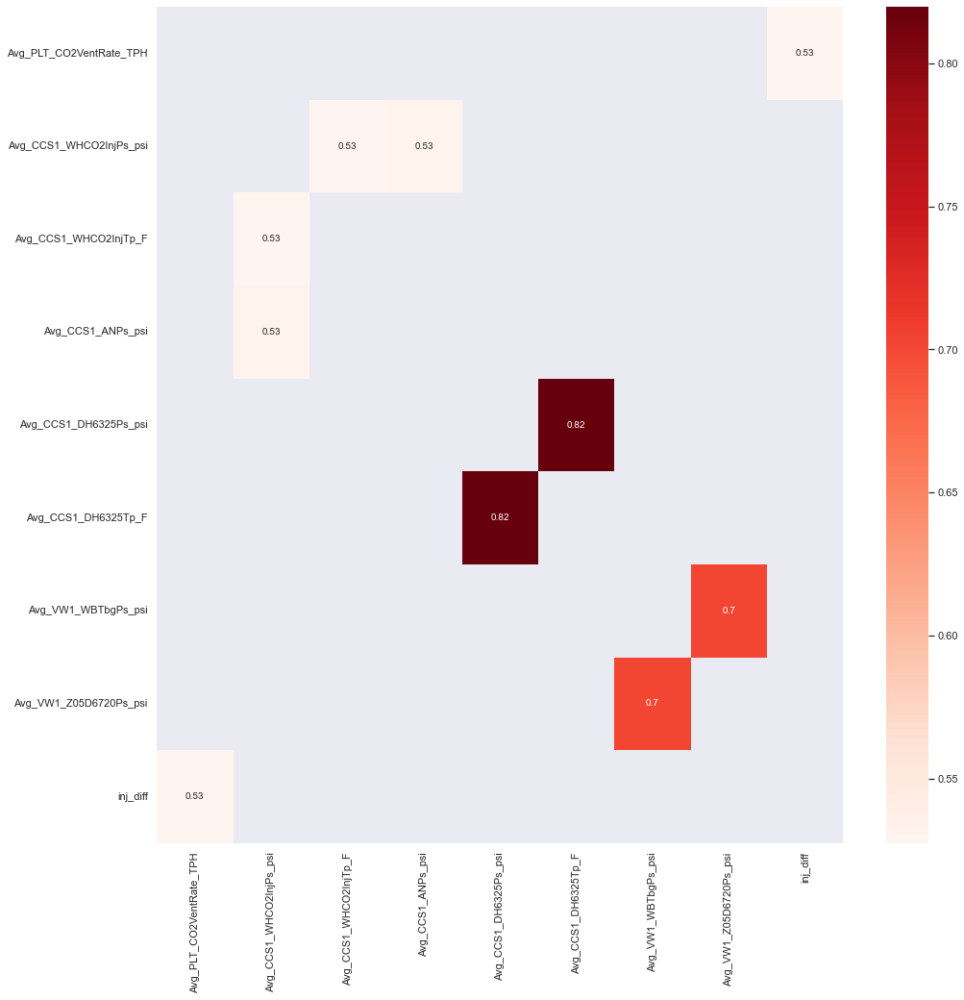

In [33]:
cor_matrix = df_clean.corr()

filteredDf = cor_matrix[((cor_matrix >= .5) | (cor_matrix <= -.5)) & (cor_matrix !=1.000)]
plt.figure(figsize=(16,16))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
plt.savefig('matrix2.jpeg')
plt.show()

In [34]:
def cap_outliers(series, zscore_threshold=3, verbose=False):
    '''Caps outliers to closest existing value within threshold (Modified Z-score).'''
    median_val = series.median()
    mad_val = series.mad() # Median absolute deviation
    
    if series.name == 'Avg_PLT_CO2VentRate_TPH' or series.name == 'inj_diff':
        zscore_threshold = 25 # Use a more lenient z-score for first and last column
    else:
        zscore_threshold = 3 # Use the default z-score threshold for other columns

    z_score = (series - median_val) / mad_val
    outliers = abs(z_score) > zscore_threshold

    series = series.copy()
    series.loc[z_score > zscore_threshold] = series.loc[~outliers].max()
    series.loc[z_score < -zscore_threshold] = series.loc[~outliers].min() 

    # For comparison purposes.
    if verbose:
            lbound = median_val - zscore_threshold * mad_val
            ubound = median_val + zscore_threshold * mad_val
            print('\n'.join(
                ['Capping outliers by the Modified Z-score method:',
                 f'   Z-score threshold: {zscore_threshold}',
                 f'   Lower bound: {lbound}',
                 f'   Upper bound: {ubound}\n']))

    return series

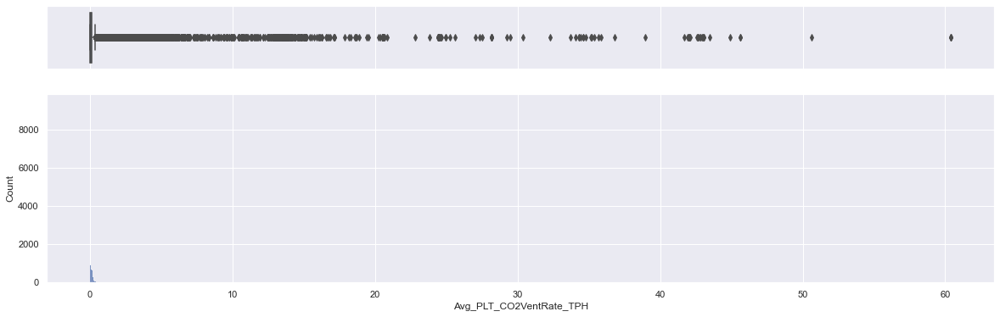

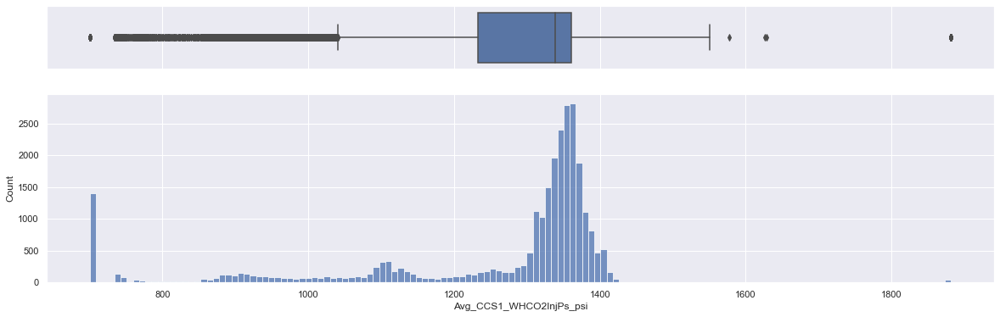

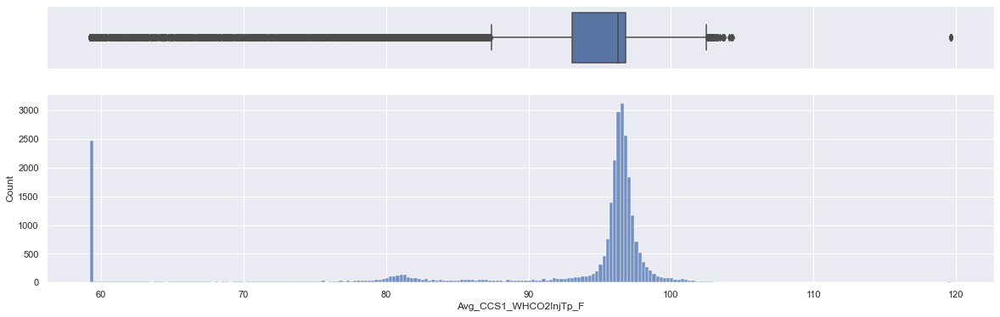

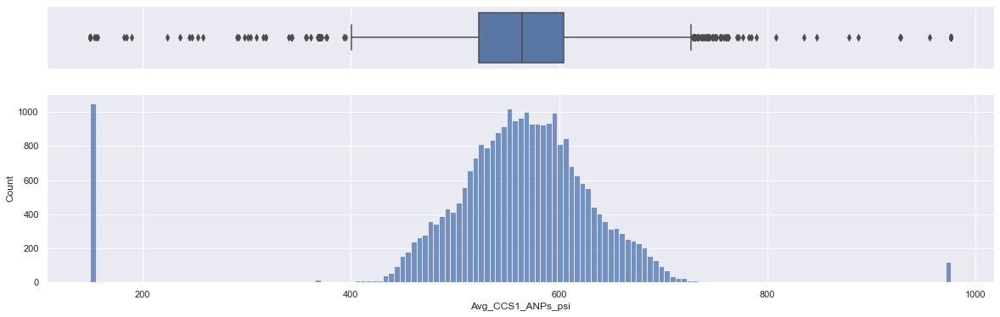

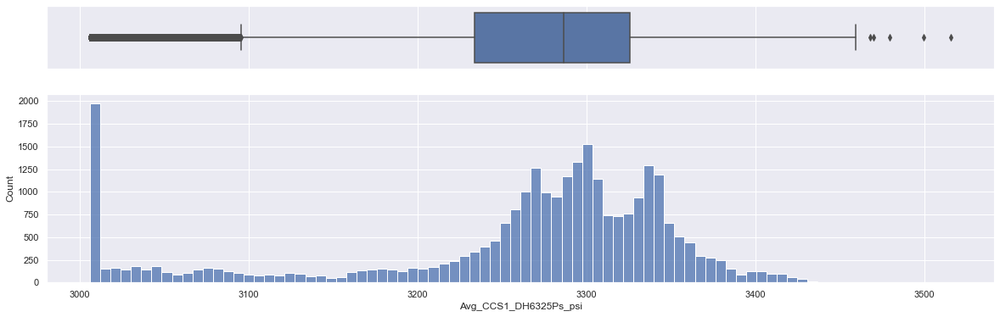

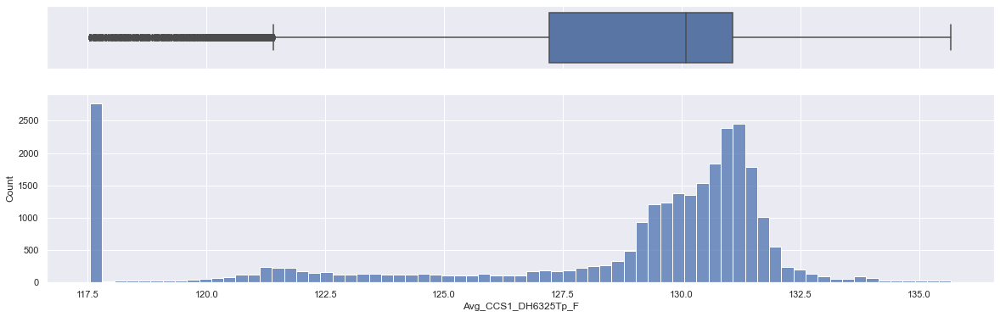

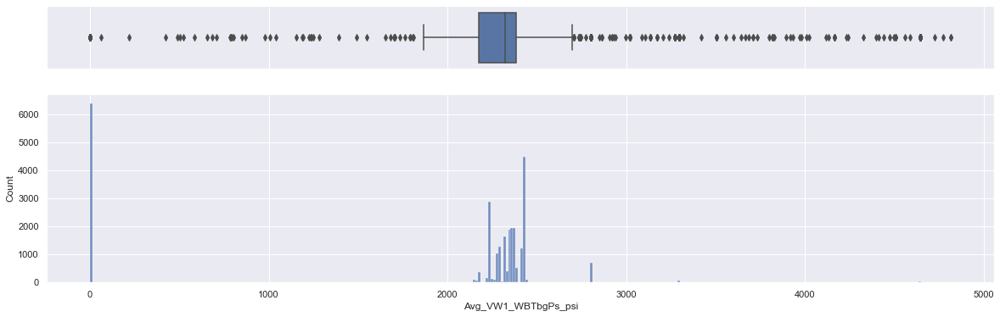

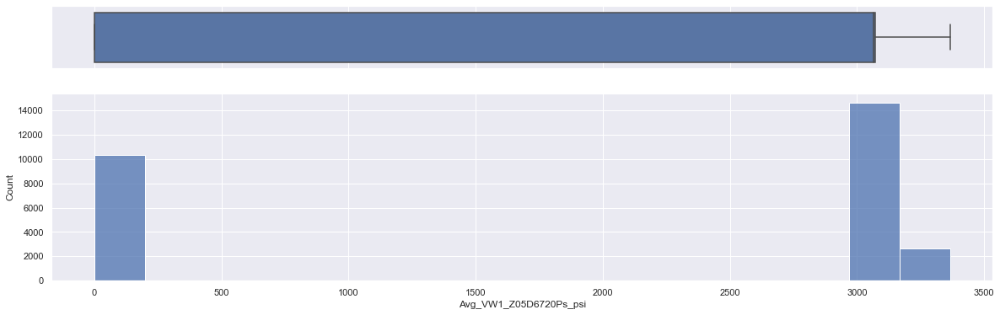

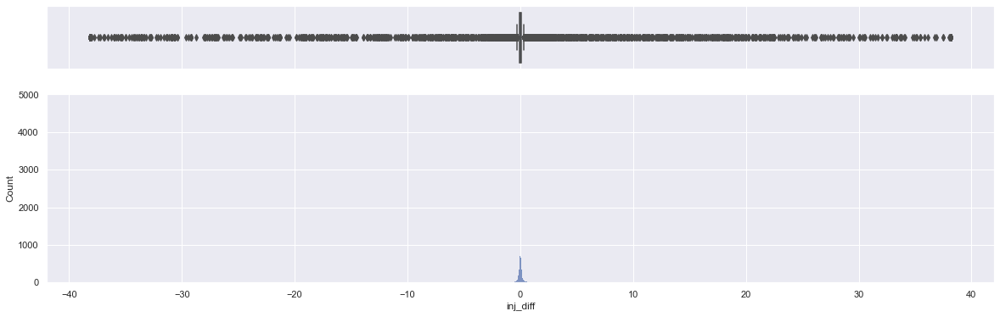

In [35]:
# Use apply because it will take each row/column, works on both user defined 
# or pandas defined function. 

df_clean = df_clean.apply(cap_outliers)

for i in df_clean.columns:
    creating_box_hist(str(i), df_clean)

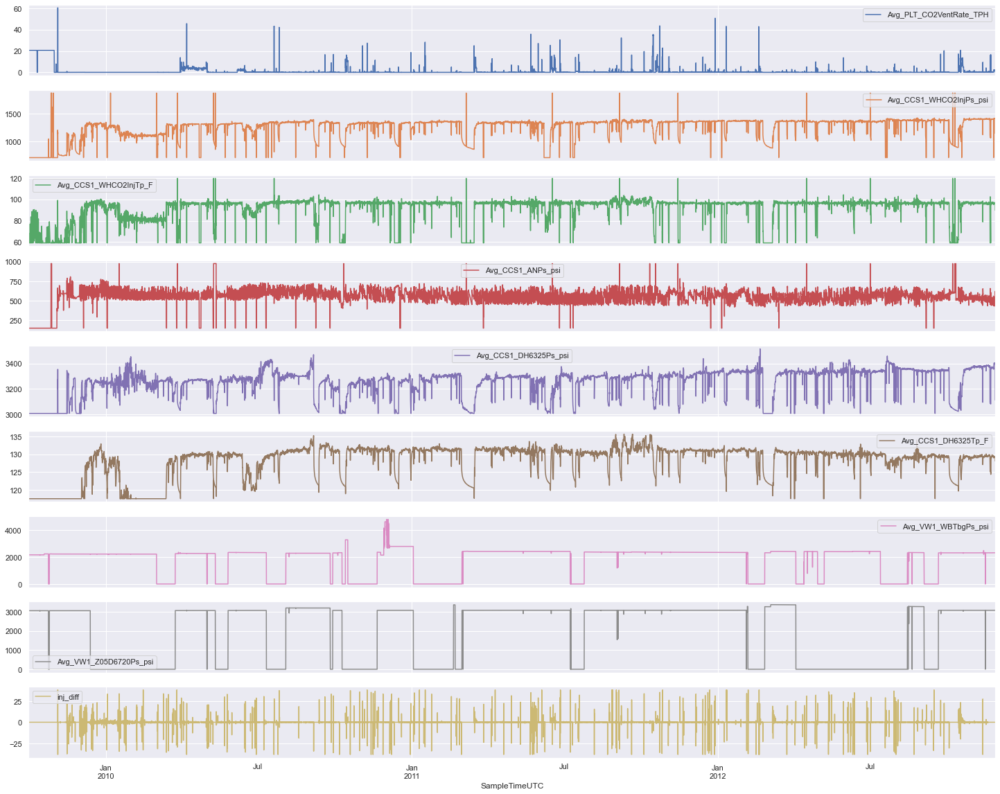

In [36]:
df_clean.plot(subplots=True, figsize=(25, 20))
plt.show()

In [37]:
df5.describe()

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_Z05D6720Ps_psi,inj_diff
count,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000
mean,2.115749,1258.626455,89.878965,610.561095,3245.051961,127.750317,1820.688587,1941.344742,-0.000210
std,132.518526,1242.341870,50.927887,991.253051,173.055836,7.136619,1012.300405,1498.618619,82.289702
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-11021.132640
25%,0.000000,1232.971047,93.060586,522.960599,3233.789231,127.209496,2173.445618,0.000000,-0.071893
50%,0.058333,1338.991226,96.269691,564.663806,3286.447463,130.089920,2322.452327,3064.169045,0.000000
75%,0.150000,1361.290213,96.848672,604.808362,3325.930558,131.076275,2384.019043,3073.305451,0.073264
max,18333.150000,39032.410160,2879.416016,24105.630860,3515.880615,135.670399,4954.731745,3365.894861,7033.459028


In [38]:
df_clean.describe()

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_Z05D6720Ps_psi,inj_diff
count,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000,27665.000000
mean,1.015644,1252.529817,90.774931,553.672618,3254.157902,128.140647,1820.683614,1941.344742,0.003157
std,3.944413,190.748799,12.008141,102.424614,106.389043,4.577965,1012.285346,1498.618619,3.742471
min,0.000000,700.605639,59.223060,149.097828,3006.236123,117.547919,0.000000,0.000000,-38.156250
25%,0.000000,1232.971047,93.060586,522.960599,3233.789231,127.209496,2173.445618,0.000000,-0.071893
50%,0.058333,1338.991226,96.269691,564.663806,3286.447463,130.089920,2322.452327,3064.169045,0.000000
75%,0.150000,1361.290213,96.848672,604.808362,3325.930558,131.076275,2384.019043,3073.305451,0.073264
max,60.416667,1881.711654,119.668026,976.819815,3515.880615,135.670399,4817.149661,3365.894861,38.197569


In [39]:
df_clean

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_Z05D6720Ps_psi,inj_diff
SampleTimeUTC,,,,,,,,,
2009-10-01 00:00:00,20.543221,700.605639,59.400879,149.097828,3006.236123,117.547919,2173.710958,3052.416044,0.0
2009-10-01 01:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.762679,3052.394926,0.0
2009-10-01 02:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.754085,3052.364040,0.0
2009-10-01 03:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.734355,3052.358177,0.0
2009-10-01 04:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.738489,3052.367251,0.0
...,...,...,...,...,...,...,...,...,...
2012-11-26 12:00:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,3072.415304,0.0
2012-11-26 13:00:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,3072.457159,0.0
2012-11-26 14:00:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,3072.467295,0.0


In [40]:
# interpolate non-zero values
df_inter=df_clean.copy()
cols_to_interpolate = ['Avg_VW1_WBTbgPs_psi',
                       #'Avg_VW1_Z11D4917Ps_psi',
                       #'Avg_VW1_Z11D4917Tp_F',
                       #'Avg_VW1_Z06D6632Tp_F',
                       'Avg_VW1_Z05D6720Ps_psi']
                       #'Avg_VW1_Z02D6982Ps_psi',
                       #'Avg_VW1_Z02D6982Tp_F']

# interpolate non-zero values
#df_interpolated = df[cols_to_interpolate].replace(0, np.NaN).interpolate()
#df_inter[cols_to_interpolate] = df_inter[cols_to_interpolate].replace(0, np.NaN).interpolate()

# replace zero values with nearest non-zero interpolated values
#for col in ['Avg_VW1_WBTbgPs_psi','Avg_VW1_Z01D7061Ps_psi']:
#    df_inter[col] = np.where(df_inter[col] == 0, df_inter[col], df_inter[col])

# replace zeros with forward fill
df_inter[cols_to_interpolate] = df_inter[cols_to_interpolate].replace(0, method='ffill')

In [41]:
# Count the number of zero values per column
zero_countsB = (df_clean == 0).sum(axis=0)
zero_countsA = (df_inter == 0).sum(axis=0)

# Print the zero counts
print(zero_countsB)
print(zero_countsA)

Avg_PLT_CO2VentRate_TPH     8850
Avg_CCS1_WHCO2InjPs_psi        0
Avg_CCS1_WHCO2InjTp_F          0
Avg_CCS1_ANPs_psi              0
Avg_CCS1_DH6325Ps_psi          0
Avg_CCS1_DH6325Tp_F            0
Avg_VW1_WBTbgPs_psi         6394
Avg_VW1_Z05D6720Ps_psi     10311
inj_diff                    4035
dtype: int64
Avg_PLT_CO2VentRate_TPH    8850
Avg_CCS1_WHCO2InjPs_psi       0
Avg_CCS1_WHCO2InjTp_F         0
Avg_CCS1_ANPs_psi             0
Avg_CCS1_DH6325Ps_psi         0
Avg_CCS1_DH6325Tp_F           0
Avg_VW1_WBTbgPs_psi           0
Avg_VW1_Z05D6720Ps_psi        0
inj_diff                   4035
dtype: int64


In [42]:
# count the number of NaN values in each column
nan_counts = df_inter.isna().sum(axis=0)

# print the results
print(nan_counts)

Avg_PLT_CO2VentRate_TPH    0
Avg_CCS1_WHCO2InjPs_psi    0
Avg_CCS1_WHCO2InjTp_F      0
Avg_CCS1_ANPs_psi          0
Avg_CCS1_DH6325Ps_psi      0
Avg_CCS1_DH6325Tp_F        0
Avg_VW1_WBTbgPs_psi        0
Avg_VW1_Z05D6720Ps_psi     0
inj_diff                   0
dtype: int64


In [43]:
df_inter

,Avg_PLT_CO2VentRate_TPH,Avg_CCS1_WHCO2InjPs_psi,Avg_CCS1_WHCO2InjTp_F,Avg_CCS1_ANPs_psi,Avg_CCS1_DH6325Ps_psi,Avg_CCS1_DH6325Tp_F,Avg_VW1_WBTbgPs_psi,Avg_VW1_Z05D6720Ps_psi,inj_diff
SampleTimeUTC,,,,,,,,,
2009-10-01 00:00:00,20.543221,700.605639,59.400879,149.097828,3006.236123,117.547919,2173.710958,3052.416044,0.0
2009-10-01 01:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.762679,3052.394926,0.0
2009-10-01 02:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.754085,3052.364040,0.0
2009-10-01 03:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.734355,3052.358177,0.0
2009-10-01 04:00:00,20.543221,700.605639,59.223060,149.097828,3006.236123,117.547919,2173.738489,3052.367251,0.0
...,...,...,...,...,...,...,...,...,...
2012-11-26 12:00:00,1.708333,1418.840352,96.514320,440.463678,3398.568276,129.185358,2327.606797,3072.415304,0.0
2012-11-26 13:00:00,1.708333,1418.537537,96.197548,432.052225,3399.234914,129.200211,2327.799504,3072.457159,0.0
2012-11-26 14:00:00,1.716667,1418.984295,96.460487,513.740069,3400.701626,129.224400,2327.909432,3072.467295,0.0


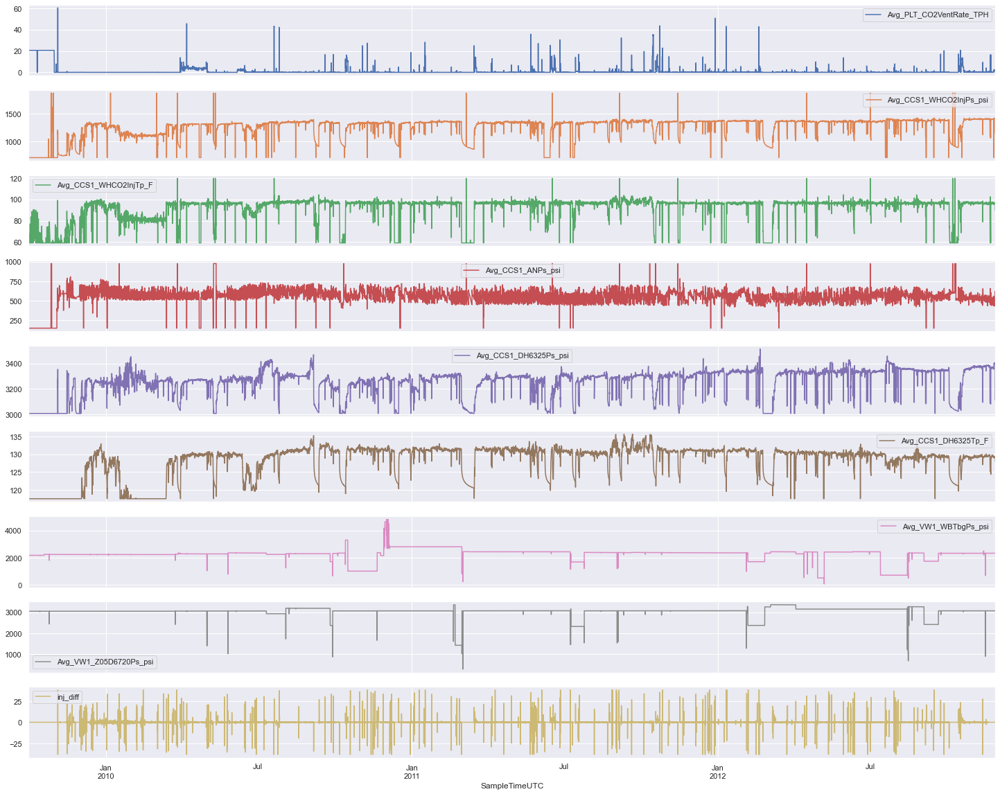

In [44]:
df_inter.plot(subplots=True, figsize=(25, 20))
plt.show()

In [45]:
#plt.figure(figsize=(16,9))
##fig = px.line(df_inter, x=df_inter.index, y=['Avg_CCS1_DH6325Ps_psi','Avg_VW1_Z01D7061Ps_psi'], title='dfinter')
#fig.update_xaxes(rangeslider_visible=True)
#fig.update_yaxes(range=[-0.5, 0.5])  # set y-axis limit here
#fig.show() 

In [46]:
base_filename = 'Cleaned_data3'
csvs_sht = os.path.join(dir_name, base_filename + "." + filename_suffix)
df_inter.to_csv(csvs_sht, index = True, header = True)
print ("File exported:", base_filename + "." + filename_suffix)

File exported: Cleaned_data3.csv


The data cleaning has focused on removing outliers and also removing high correlation values. As can be seen above, a lot of the data from the observation well is highly correlatable and not very useful. 

Finally, we remove data that is outside the modified Z-score range (http://colingorrie.github.io/outlier-detection.html).

# Deployment of LSTM Model on Train Set and Evaluation 

LSTMs can be used to model univariate time series forecasting problems, where we have a single series of observations and a model is required to learn from the series of past observations to predict the next value in the sequence.

### References

1. https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/
2. https://towardsdatascience.com/dropout-in-neural-networks-47a162d621d9
3. https://machinelearningmastery.com/stacked-long-short-term-memory-networks/
4. https://machinelearningmastery.com/return-sequences-and-return-states-for-lstms-in-keras/
5. https://machinelearningmastery.com/learning-curves-for-diagnosing-machine-learning-model-performance/
6. https://www.v7labs.com/blog/neural-networks-activation-functions

### Libraries

In [47]:
# Sklearn Liraries
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error , mean_squared_error, r2_score
from sklearn.model_selection import TimeSeriesSplit

#Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential 
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dense,LSTM,Activation

from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from tensorflow.keras.layers import Dense,LSTM,Activation, Dropout, Bidirectional, TimeDistributed

# Nueral Networks are stocastic; setting random seeds ensures we get the same output each time
#SEED = 42
#os.environ['PYTHONHASHSEED']=str(SEED)
#os.environ['TF_CUDNN_DETERMINISTIC'] = '1'  # TF 2.1
#np.random.seed(SEED)
tf.random.set_seed(SEED)
#python_random.seed(SEED)

print(tf.__version__)

2.11.0


### Functions

In [48]:
# normalization to ensure data is on same scale
scaler = MinMaxScaler(feature_range=(-1, 1))

def reshape_data(train_x, train_y, test_x, test_y):
    # convert to [rows, columns] structure
    x_train = train_x.reshape((train_x.shape[0], train_x.shape[1]))
    y_train = train_y.reshape((train_y.shape[0], 1))
    
    x_test = test_x.reshape((test_x.shape[0], test_x.shape[1]))
    y_test = test_y.reshape((test_y.shape[0], 1))

    # normalization features
    x_scaled = scaler.fit_transform(x_train)
    testx_scaled = scaler.transform(x_test)
    
    y_scaled = scaler.fit_transform(y_train)
    testy_scaled = scaler.transform(y_test)
    
    # horizontally stack columns
    dataset_stacked_train = np.hstack((x_scaled, y_scaled))
    dataset_stacked_test = np.hstack((testx_scaled, testy_scaled))
    
    print ("train dataset_stacked.shape" , dataset_stacked_train.shape) 
    print ("test dataset_stacked.shape" , dataset_stacked_test.shape)
    return dataset_stacked_train, dataset_stacked_test

The LSTM model will learn a function that maps a sequence of past observations as input to an output observation. As such, the sequence of observations must be transformed into multiple examples from which the LSTM can learn.

In [49]:
# split sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out=1):
    
    """
    create lagged value sequence for time series data
    
    Parameters:
    ============
    
    Sequence:
    =========
    The dataset contain x and y values. x can be single column or mutliple columns. Y will be last column.
    
    n_steps_in:
    ===========
    The preferrable window size for past data (or lagged values). 
    
    n_steps_out:
    ============
    The default is 1.
    
    output:
    =======
    x: The independent variable array
    y: The y(dependent variable)
    
    """
    X, y = list(), list()
    for i in range(len(sequences)):
    # find the end of this pattern
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out-1
        # check if we are beyond the dataset
        if out_end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [50]:
#loss plot to identify optimal model parameters from training
def loss_plot(history):
    
    plt.rcParams['figure.figsize'] = [24, 12]
    plt.plot(history.history['mse'])
    plt.plot(history.history['val_mse'])
    plt.title('model accuracy')
    plt.ylabel('Mean Square Error')
    plt.xlabel('epoch')
    plt.legend(['train MSE', 'val MSE'], loc='upper left')
    plt.show()
    
    plt.rcParams['figure.figsize'] = [24, 12]
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train loss', 'val loss'], loc='upper left')
    plt.show()

In [51]:
# To evaluate how well model predictions are doing
def evaluate_prediction(predictions, actual):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()
    r2 = r2_score(actual, predictions)
    print('Mean Square Error: {:.2f}'.format(mse))
    print('Mean Absolute Error: {:.2f}'.format(mae))
    print('Root Mean Square Error: {:.2f}'.format(rmse))
    print('R-Square: {:.2f}'.format(r2))
    print('')
    print('')
    
    list_df = [mse, rmse, mae, r2]
    df = pd.DataFrame(list_df, index=["MSE", "RMSE", "MAE", "R^2"])
    
    return df

#### The below function provides general LSTM model structure. 

In [52]:
# To Note:
# 1. n-neurons: Using 50 neurons, which can increased or decreased to check if it affects model results.
# 2. lr = Learning rate: Very important parameter; smaller values decrease model overfitting but increase computation time
# 3. optimizer = Adam: Note that we have to use the .legacy as new version of tf has some conflict
# 4. Dropout: By dropping out the nodes (input and hidden layer) in a neural network, all the forward and backwards
#    connections with a dropped node are temporarily removed, thus creating a new network architecture out of the 
#    parent network. The nodes are dropped by a dropout probability of p. It is applied to reduce overfitting
# 5. Stacked LSTM: An LSTM layer provides a sequence output rather than a single value output to the LSTM layer. 
#    Specifically, one output per input time step (creating a 3D data set), rather than one output time step for all 
#    input time steps (i.e. 1 single value)

# The selected model is a 2 layer STACKED LSTM. This can also be increased by adding a new LSTM layer

def LSTM_model(opt, n_steps_in, n_features, n_steps_out, neurons, dropout, activation):
    
    """
    Parameters:
    ============
    
    opt:
    ====
    The learning rate for the model. default is 0.1
    
    n_steps_in:
    ===========
    The window size for past data(or lagged values), called samples.
    
    n_features:
    ============
    How many independent variables are used. 

    n_steps_out:
    =============
    The output size, which is 1 in this case
    
    output:
    =======
    compiled model
    
    """
    # define model
    model = Sequential()
    
    # add LSTM layer with tanh activation. return_sequences=True is used so we can feed another 
    # LSTM layer to model. default is false.
    model.add(LSTM(neurons, activation=activation, return_sequences=True, input_shape=(n_steps_in, n_features)))
    model.add(Dropout(dropout))
    # second layer of LSTM with tanh activation. Now return sequence is False, as there will be no other layer
    # except output layer.
    model.add(LSTM(neurons, activation=activation))
    model.add(Dropout(dropout))
    
    # final layer with output
    model.add(Dense(n_steps_out))
    
    # activation function of output layer
    model.add(Activation('tanh'))
    
    # compile model with loss funtion, optimizer and metrics
    model.compile(loss='mse' , optimizer=opt , metrics=['mse'])
    
    return model

In [53]:
data = df_inter.copy()
data.index

DatetimeIndex(['2009-10-01 00:00:00', '2009-10-01 01:00:00',
               '2009-10-01 02:00:00', '2009-10-01 03:00:00',
               '2009-10-01 04:00:00', '2009-10-01 05:00:00',
               '2009-10-01 06:00:00', '2009-10-01 07:00:00',
               '2009-10-01 08:00:00', '2009-10-01 09:00:00',
               ...
               '2012-11-26 07:00:00', '2012-11-26 08:00:00',
               '2012-11-26 09:00:00', '2012-11-26 10:00:00',
               '2012-11-26 11:00:00', '2012-11-26 12:00:00',
               '2012-11-26 13:00:00', '2012-11-26 14:00:00',
               '2012-11-26 15:00:00', '2012-11-26 16:00:00'],
              dtype='datetime64[ns]', name='SampleTimeUTC', length=27665, freq='H')

In [54]:
# Create numpy array for further analysis
# choose a number of time steps - change this accordingly
n_steps_in = 50 # Smaller the value, more accurate, slower. Tested 30, 50, 100, with 100 being the worst, and 30 as best
n_steps_out = 1

train = data[:("2011")]
test = data[("2012"):]

x_train, y_train = train.drop("inj_diff", axis=1).values, train["inj_diff"].values
x_test, y_test = test.drop("inj_diff", axis=1).values, test["inj_diff"].values

train_data, test_data = reshape_data(x_train, y_train, x_test, y_test)

# covert into input/output
X, y = split_sequences(train_data, n_steps_in, n_steps_out)
x_test, y_test = split_sequences(test_data, n_steps_in, n_steps_out)
print ("X.shape" , X.shape) 
print ("y.shape" , y.shape)

n_features = X.shape[2]

train dataset_stacked.shape (19728, 9)
test dataset_stacked.shape (7937, 9)
X.shape (19679, 50, 8)
y.shape (19679, 1)


### Testing on the Train dataset. 
##### Variables for sensitivity to be tested 
1. Size of n_steps_in
2. Learning rate (lr)
3. Number of epochs
4. Size of steps_per_epoch
5. Number of neurons
6. Dropout size
7. Type of activation function

In [55]:
train = df_inter[:-231]
blind = df_inter[-231:]

In [56]:
# count the number of NaN values in each column
nan_counts = df_inter.isna().sum(axis=0)

# print the results
print(nan_counts)

Avg_PLT_CO2VentRate_TPH    0
Avg_CCS1_WHCO2InjPs_psi    0
Avg_CCS1_WHCO2InjTp_F      0
Avg_CCS1_ANPs_psi          0
Avg_CCS1_DH6325Ps_psi      0
Avg_CCS1_DH6325Tp_F        0
Avg_VW1_WBTbgPs_psi        0
Avg_VW1_Z05D6720Ps_psi     0
inj_diff                   0
dtype: int64


In [57]:
train# count the number of NaN values in each column
nan_counts = train.isna().sum(axis=0)

# print the results
print(nan_counts)

Avg_PLT_CO2VentRate_TPH    0
Avg_CCS1_WHCO2InjPs_psi    0
Avg_CCS1_WHCO2InjTp_F      0
Avg_CCS1_ANPs_psi          0
Avg_CCS1_DH6325Ps_psi      0
Avg_CCS1_DH6325Tp_F        0
Avg_VW1_WBTbgPs_psi        0
Avg_VW1_Z05D6720Ps_psi     0
inj_diff                   0
dtype: int64


In [58]:
n_steps_in = 30
lr = 0.001
epochs = 500
neurons = 50
dropout = 0.2
activation = 'tanh'

opt = tf.keras.optimizers.legacy.Adam(learning_rate=lr)

train = train[:("2012")]
test = train[("2012"):]

x_train, y_train = train.drop("inj_diff", axis=1).values, train["inj_diff"].values
x_test, y_test = test.drop("inj_diff", axis=1).values, test["inj_diff"].values

train_data, test_data = reshape_data(x_train, y_train, x_test, y_test)

# covert into input/output
X, y = split_sequences(train_data, n_steps_in, n_steps_out)
x_test, y_test = split_sequences(test_data, n_steps_in, n_steps_out)
print ("X.shape" , X.shape) 
print ("y.shape" , y.shape)

n_features = X.shape[2]

# caclulate steps based on legth of data and window size
steps_per_epoch = len(X)//n_steps_in
model = LSTM_model(opt, n_steps_in, n_features, n_steps_out, neurons, dropout, activation)
History =  model.fit(X, y, epochs=epochs, steps_per_epoch=steps_per_epoch,
                    verbose=1 , validation_split=0.2, shuffle=False,
                        callbacks=[EarlyStopping('val_loss', mode='min', patience=20)])

train dataset_stacked.shape (27434, 9)
test dataset_stacked.shape (7706, 9)
X.shape (27405, 30, 8)
y.shape (27405, 1)
Epoch 1/500
913/913 [==============================] - 41s 37ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 2/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 3/500
913/913 [==============================] - 31s 34ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0095 - val_mse: 0.0095
Epoch 4/500
913/913 [==============================] - 33s 36ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 5/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 6/500
913/913 [==============================] - 31s 34ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 7/500
913/913 [==============================] - 31s 34ms/step - l

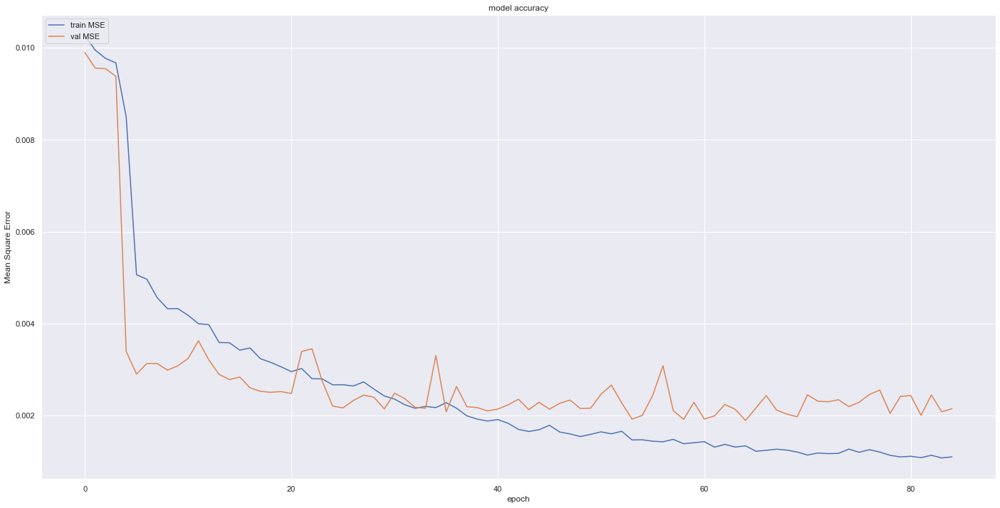

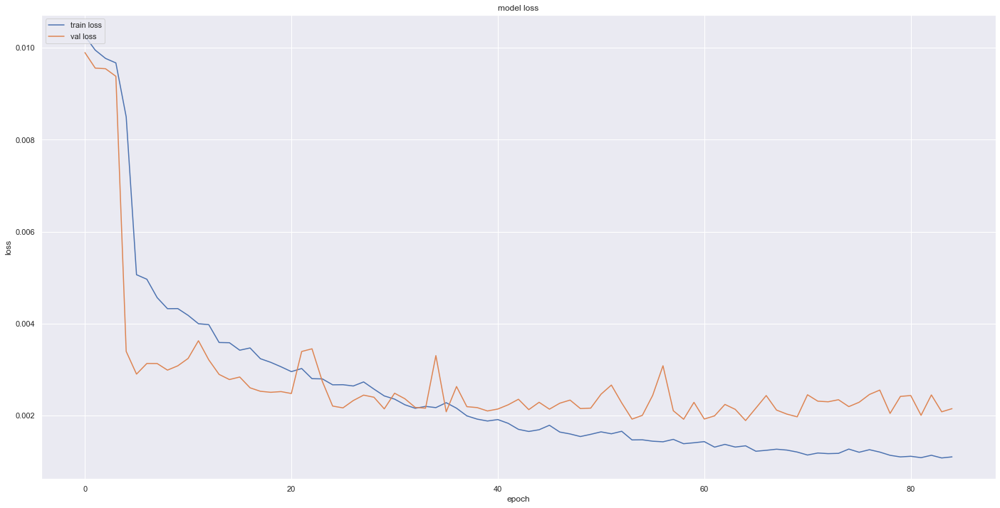

In [59]:
# plot Mean absolute error
loss_plot(History)

240/240 [==============================] - 5s 13ms/step
Mean Square Error: 2.39
Mean Absolute Error: 0.37
Root Mean Square Error: 1.55
R-Square: 0.82




<AxesSubplot:xlabel='SampleTimeUTC'>

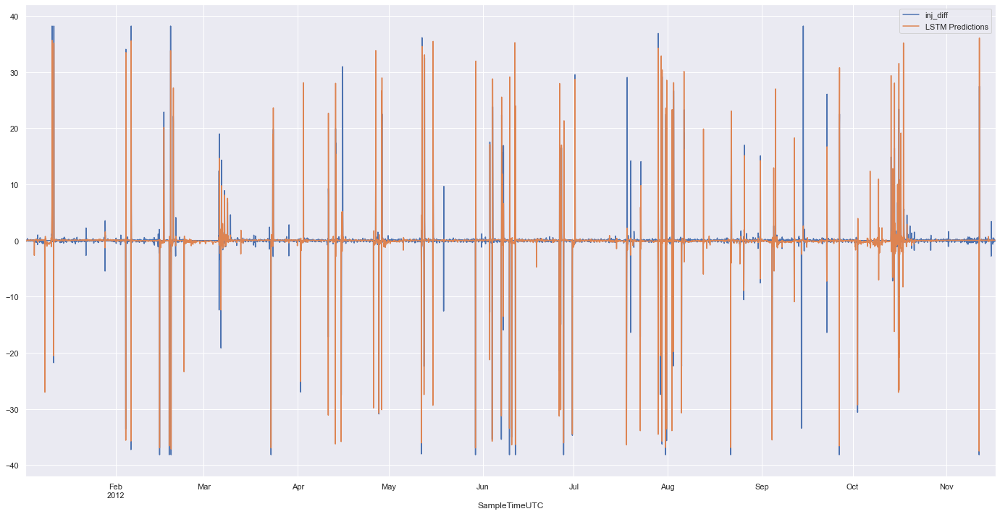

In [60]:
# make predictions and transform
test_pred = scaler.inverse_transform(model.predict(x_test))

pred_test = test[(n_steps_in-1):].copy()
pred_test["LSTM Predictions"] = test_pred
pred_test = pred_test[["inj_diff", "LSTM Predictions"]]

# evaluate predictions accuracy
evaluate_prediction(pred_test["LSTM Predictions"], pred_test["inj_diff"])

pred_test.plot()

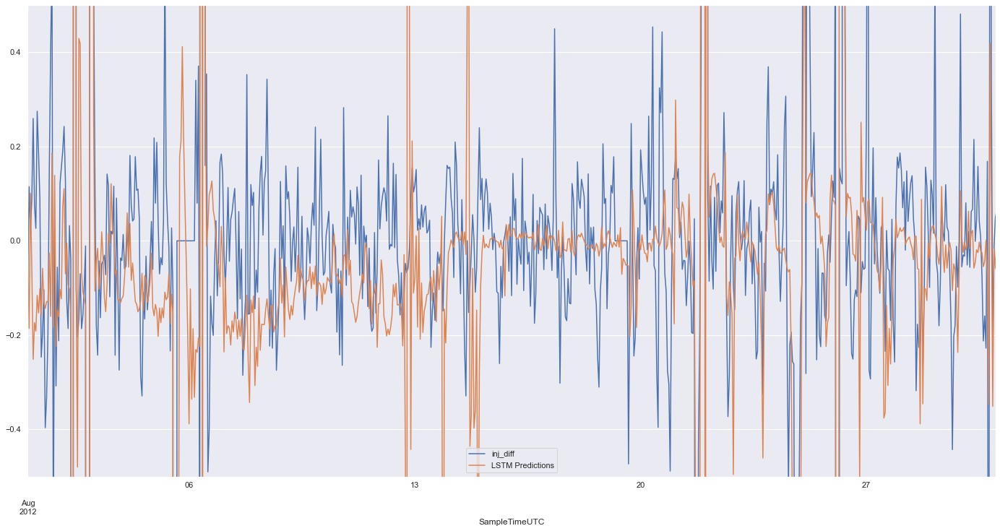

In [61]:
pred_test.plot()
# Set the y-axis limit
plt.ylim([-0.5, 0.5])
plt.xlim(['2012-08-01', '2012-08-31'])

# Display the plot
plt.show()

In [62]:
pred_test

,inj_diff,LSTM Predictions
SampleTimeUTC,,
2012-01-02 05:00:00,-0.082985,-0.014222
2012-01-02 06:00:00,0.017317,0.022187
2012-01-02 07:00:00,-0.199262,-0.029647
2012-01-02 08:00:00,-0.119444,-0.019470
2012-01-02 09:00:00,-0.073265,0.028408
...,...,...
2012-11-16 21:00:00,-0.059722,0.057230
2012-11-16 22:00:00,0.075348,0.061661
2012-11-16 23:00:00,0.021180,0.064287


# Deployment of Model on Combined Data Set and Prediction on Blind Data Set

In [63]:
train = df_inter[:-231]
blind = df_inter[-231:]

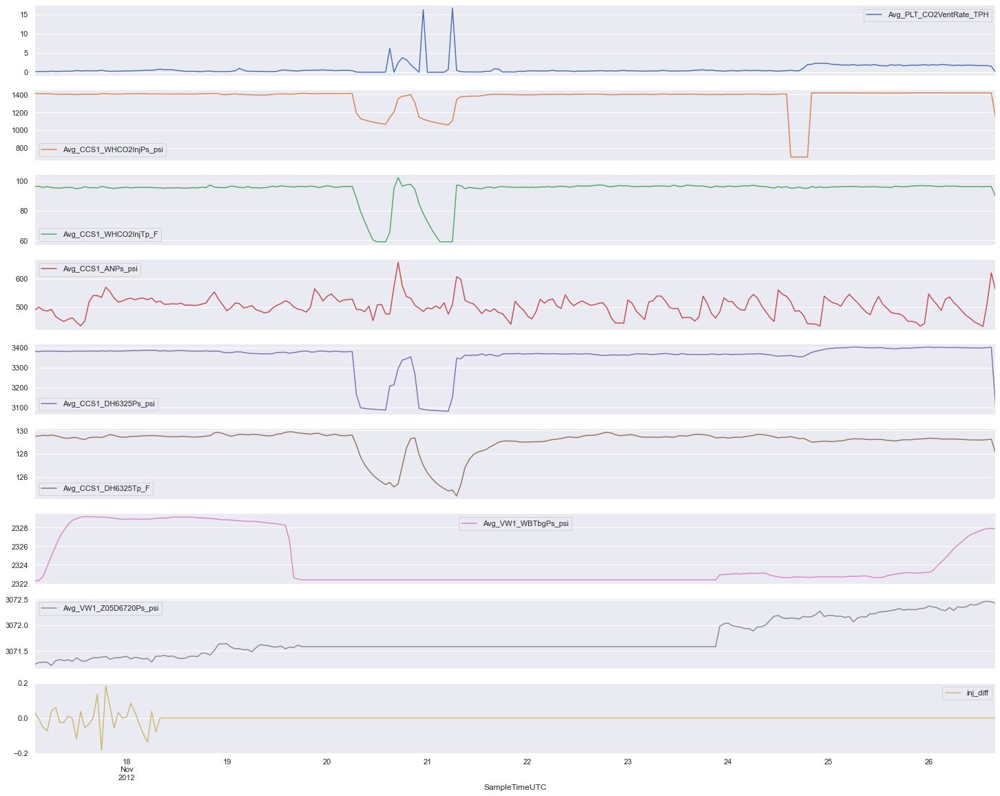

In [64]:
blind.plot(subplots=True, figsize=(25, 20))
plt.show()

In [65]:
nan_count = np.sum(np.isnan(train))
print(f"There are {nan_count} NaN values in data2.")

There are Avg_PLT_CO2VentRate_TPH    0
Avg_CCS1_WHCO2InjPs_psi    0
Avg_CCS1_WHCO2InjTp_F      0
Avg_CCS1_ANPs_psi          0
Avg_CCS1_DH6325Ps_psi      0
Avg_CCS1_DH6325Tp_F        0
Avg_VW1_WBTbgPs_psi        0
Avg_VW1_Z05D6720Ps_psi     0
inj_diff                   0
dtype: int64 NaN values in data2.


In [66]:
nan_count = np.sum(np.isnan(blind))
print(f"There are {nan_count} NaN values in data2.")

There are Avg_PLT_CO2VentRate_TPH    0
Avg_CCS1_WHCO2InjPs_psi    0
Avg_CCS1_WHCO2InjTp_F      0
Avg_CCS1_ANPs_psi          0
Avg_CCS1_DH6325Ps_psi      0
Avg_CCS1_DH6325Tp_F        0
Avg_VW1_WBTbgPs_psi        0
Avg_VW1_Z05D6720Ps_psi     0
inj_diff                   0
dtype: int64 NaN values in data2.


In [67]:
n_steps_in = 30
lr = 0.001
epochs = 500
neurons = 50
dropout = 0.2
activation = 'tanh'

opt = tf.keras.optimizers.legacy.Adam(learning_rate=lr)

x_train, y_train = train.drop("inj_diff", axis=1).values, train["inj_diff"].values
x_test, y_test = blind.drop("inj_diff", axis=1).values, blind["inj_diff"].values

train_data, test_data = reshape_data(x_train, y_train, x_test, y_test)

# covert into input/output
X, y = split_sequences(train_data, n_steps_in, n_steps_out)
x_test, y_test = split_sequences(test_data, n_steps_in, n_steps_out)
print ("X.shape" , X.shape) 
print ("y.shape" , y.shape)

n_features = X.shape[2]

train dataset_stacked.shape (27434, 9)
test dataset_stacked.shape (231, 9)
X.shape (27405, 30, 8)
y.shape (27405, 1)


In [68]:
nan_count = np.sum(np.isnan(x_test))
print(f"There are {nan_count} NaN values in x_test.")

There are 0 NaN values in x_test.


In [69]:
nan_count = np.sum(np.isnan(x_train))
print(f"There are {nan_count} NaN values in x_train.")

There are 0 NaN values in x_train.


In [70]:

# caclulate steps based on legth of data and window size
steps_per_epoch = len(X)//n_steps_in
model = LSTM_model(opt, n_steps_in, n_features, n_steps_out, neurons, dropout, activation)
History =  model.fit(X, y, epochs=epochs, steps_per_epoch=steps_per_epoch,
                    verbose=1 , validation_split=0.2, shuffle=False,
                        callbacks=[EarlyStopping('val_loss', mode='min', patience=20)])

Epoch 1/500
913/913 [==============================] - 39s 36ms/step - loss: 0.0104 - mse: 0.0104 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 2/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0100 - mse: 0.0100 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 3/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 4/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 5/500
913/913 [==============================] - 32s 35ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0096 - val_mse: 0.0096
Epoch 6/500
913/913 [==============================] - 33s 37ms/step - loss: 0.0079 - mse: 0.0079 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 7/500
913/913 [==============================] - 21s 23ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 8/500
913/913 [==============================] - 

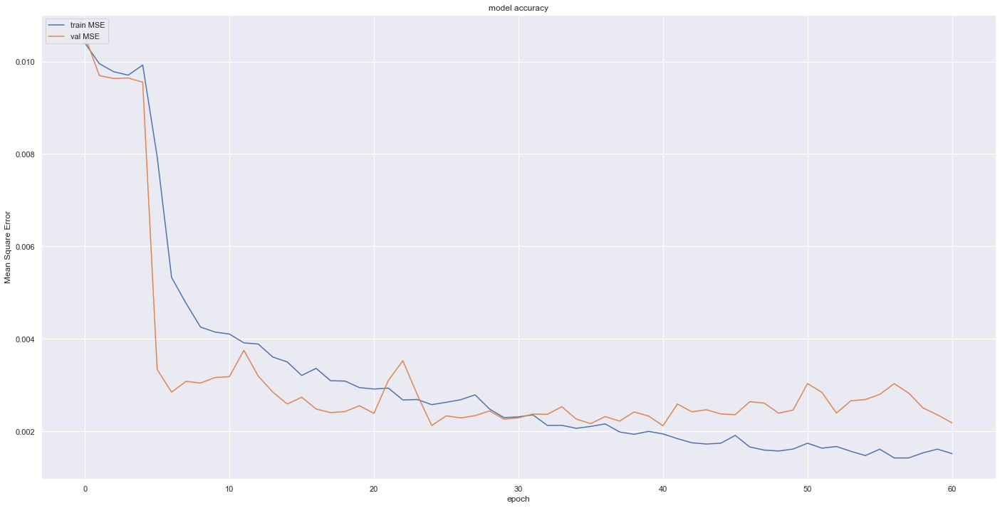

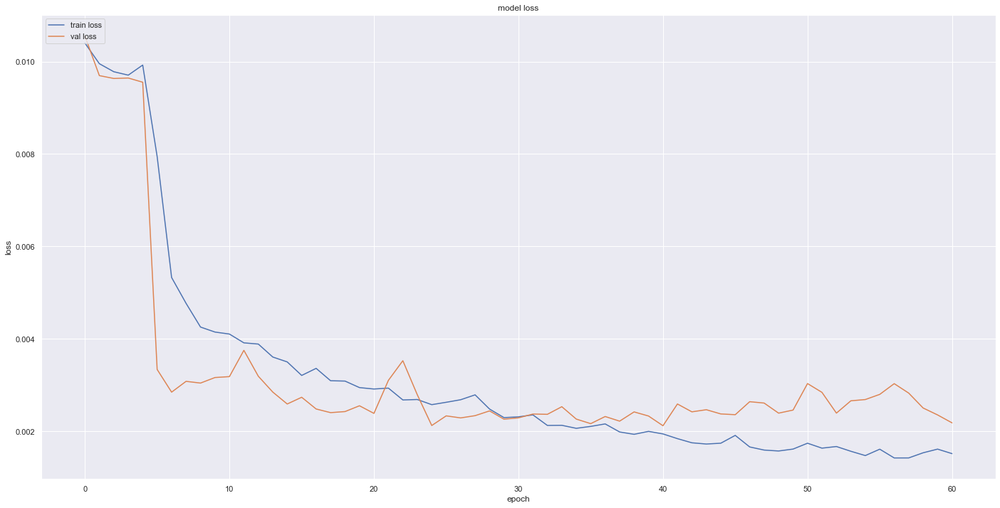

In [71]:
# plot Mean absolute error
loss_plot(History)

7/7 [==============================] - 1s 7ms/step
Mean Square Error: 27.70
Mean Absolute Error: 1.21
Root Mean Square Error: 5.26
R-Square: -871078.60




<AxesSubplot:xlabel='SampleTimeUTC'>

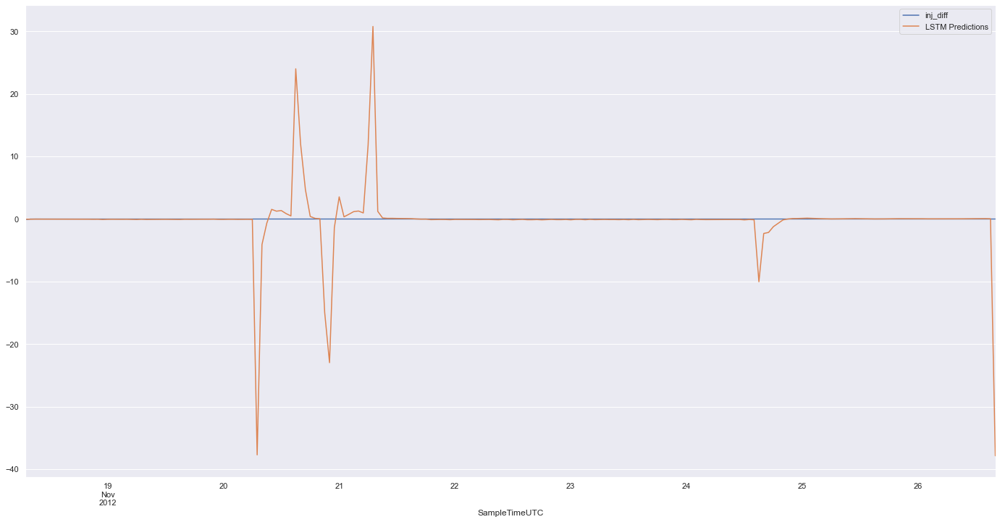

In [72]:
# make predictions and transform
test_pred = scaler.inverse_transform(model.predict(x_test))

pred_test = blind[(n_steps_in-1):].copy()
pred_test["LSTM Predictions"] = test_pred
pred_test = pred_test[["inj_diff", "LSTM Predictions"]]

# evaluate predictions accuracy
evaluate_prediction(pred_test["LSTM Predictions"], pred_test["inj_diff"])

pred_test.plot()

In [73]:
pred_test

,inj_diff,LSTM Predictions
SampleTimeUTC,,
2012-11-18 07:00:00,-0.080345,-0.020829
2012-11-18 08:00:00,0.000000,-0.025639
2012-11-18 09:00:00,0.000000,-0.009744
2012-11-18 10:00:00,0.000000,-0.017867
2012-11-18 11:00:00,0.000000,-0.013552
...,...,...
2012-11-26 12:00:00,0.000000,0.060665
2012-11-26 13:00:00,0.000000,0.069012
2012-11-26 14:00:00,0.000000,0.068380


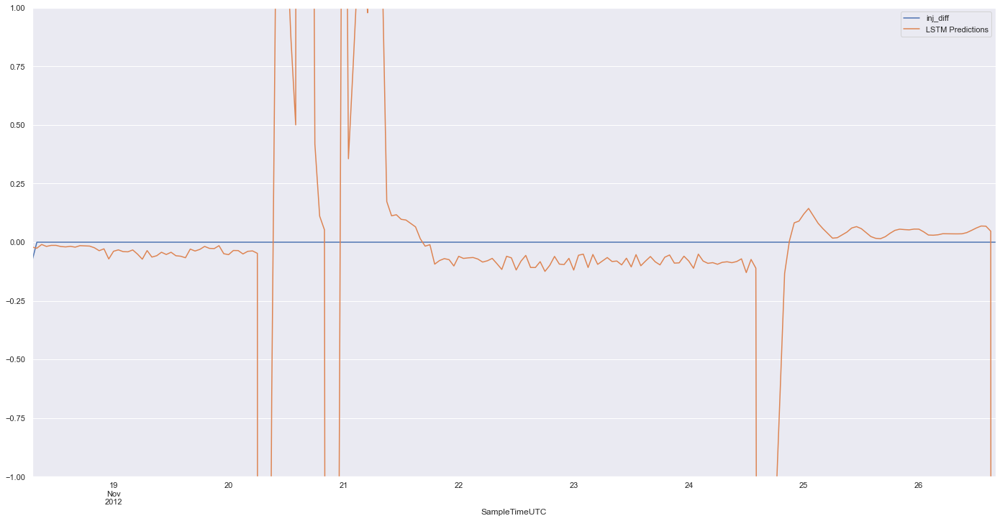

In [74]:
pred_test.plot()
# Set the y-axis limit
plt.ylim([-1, 1])
#plt.xlim(['2012-08-01', '2012-08-31'])

# Display the plot
plt.show()

In [75]:
blind2 = blind[-202:]
blind2["LSTM Predictions"] = test_pred

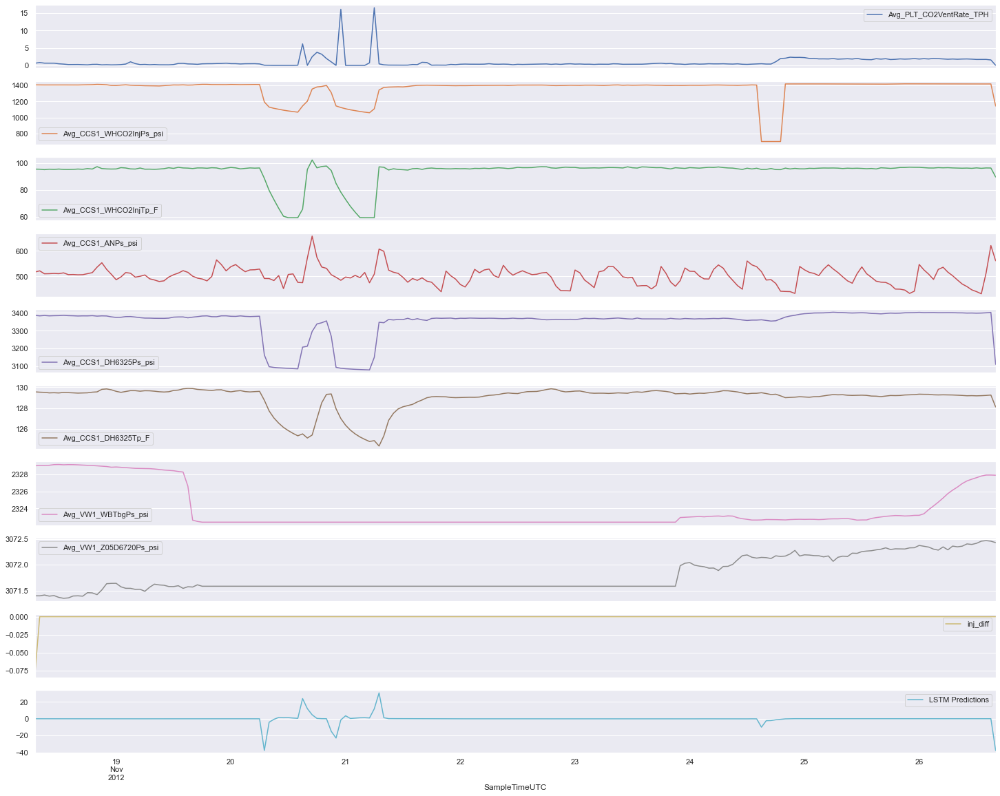

In [76]:
blind2.plot(subplots=True, figsize=(25, 20))
plt.show()

# Conclusion

In [77]:
# save dataframe to CSV file
pred_test.to_csv("output.csv", index=False)

In [78]:
count = 'Completed Process'
elapsed = (time.time() - start)
print ("%s in %s seconds" % (count,elapsed))

Completed Process in 4400.006311416626 seconds


Submission

Once the machine learning model is developed and evaluated, contestants submit the ML code to an SPEMLChallenge@gmail.com.  The results are submitted to the XEEK.org platform for preliminary scoring.   

# Generate Requirements File

In [79]:
import subprocess

# List all installed packages and their versions
packages = subprocess.check_output(['pip', 'freeze']).decode('utf-8').split('\n')

# Remove any packages that don't have a version number
packages = [package for package in packages if package and '==' in package]

# Write the packages to a requirements.py file
with open('requirements.py', 'w') as f:
    f.write('packages = [\n')
    for package in packages:
        f.write(f"    '{package}',\n")
    f.write(']\n')